# Rain Prediction in Australia
### EDA + Preprocessing + FE + Modelling


The [Rain in Australia dataset](https://kaggle.com/jsphyg/weather-dataset-rattle-package) contains about 10 years of daily weather observations from numerous Australian weather stations.

I will try to answer the question that whether or not it will rain tomorrow in Australia. I  implement Logistic Regression with Python and Scikit-Learn.

To answer the question, we build a classifier to predict whether or not it will rain tomorrow in Australia. We train a binary classification model using Logistic Regression. I have used the Rain in Australia dataset for this project.


<img src="https://acegif.com/wp-content/uploads/rainy-10.gif" width="480">




                                                                                                              Ruchir Mandora

# 1. Downloading dataset directly from `Kaggle` using `opendatasets` library

In [1]:
import opendatasets as od  

In [2]:
od.version()

'0.1.20'

The dataset can now be downloaded using od.download

In [3]:
dataset_url = 'https://www.kaggle.com/jsphyg/weather-dataset-rattle-package'

In [4]:
od.download(dataset_url)

Skipping, found downloaded files in ".\weather-dataset-rattle-package" (use force=True to force download)


Once the above command is executed, the dataset is downloaded and extracted to the the directory `weather-dataset-rattle-package`.

# 2. Importing necessary libraries

In [5]:
import os
import pandas as pd
import numpy as np

import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10,6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)


# 3. Loading Dataset

In [6]:
data_dir = './weather-dataset-rattle-package'

In [7]:
os.listdir(data_dir)

['weatherAUS.csv']

In [8]:
train_csv = data_dir + '/weatherAUS.csv'

In [9]:
raw_df = pd.read_csv(train_csv)

# 4. Data Preprocessing

Data preprocessing is a process of converting raw data to a suitable format to extract insights. It is the first and foremost step in the Data Science life cycle. Data Preprocessing makes sure that data is clean, organize and read-to-feed to the Machine Learning model.

### 4.1 View dimensions of dataset

In [10]:
raw_df.shape

(145460, 23)

The dataset contains over `145460` rows and `23` columns. 

### 4.2 Preview the dataset 

In [11]:
raw_df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
145458,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


### 4.3 View column names

In [12]:
raw_df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

The dataset contains date, numeric and categorical columns. My objective is to create a model to predict the value in the column `RainTomorrow`.



### 4.4 View statistical properties of dataset 

In [13]:
raw_df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


#### Important points to note

Simple statistics like count, mean, min, max, etc is calculated for attributes having numeric datatype.
Some of the conclusions drawn from the above table are:

1. The average minimum temperature is 12.194 and average maximum temperature is 23.221 degree Celsius.
2.  The mean rainfall is 2.36 mm.
3.  The average sunshine recieved is 7.61 hour.
4.  The average wind gust speed is 40.035 km/hr.
5. The minimum temperature recorded is -8.5 degree Celsius and the maximum recorded temperature is 48.1 degree Celsius.
6. The minimum rainfall recorded for a particular day is 0 mm and maximum is 371 mm.
7. The median evaporation is 4.8 mm.

### 4.5 View summary of dataset 


In [14]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

We can see that the dataset contains mixture of `categorical` and `numerical` variables.

* Categorical variables have data type object.

* Numerical variables have data type float64.

Also, there are some missing values in the dataset

### 4.6 Check for Null Values

In [15]:
raw_df.isnull().sum()

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

### 4.7  Visualizing Missing Values 

<AxesSubplot:>

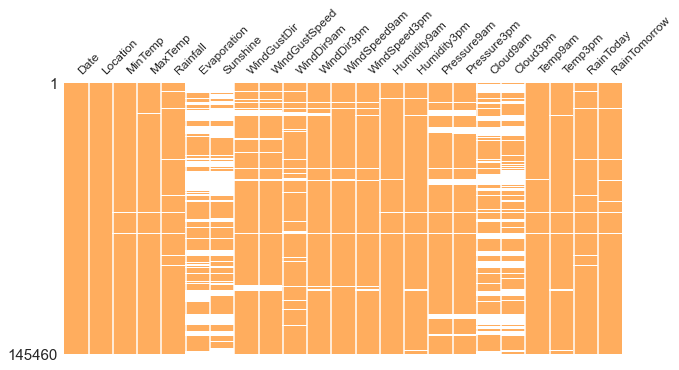

In [16]:
import missingno as msno
msno.matrix( raw_df,sparkline=False, figsize=(10,5), fontsize=12, color=(1, 0.68, 0.37))

<AxesSubplot:>

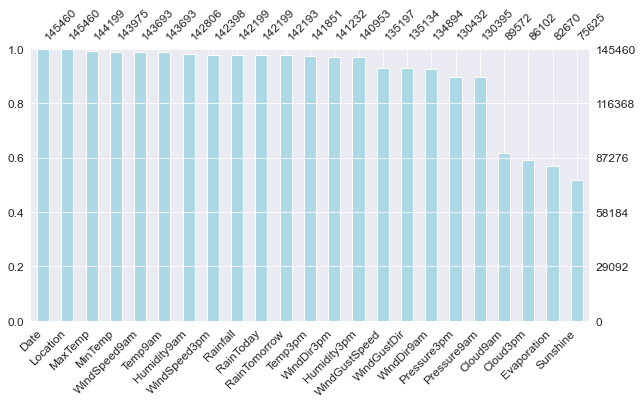

In [17]:
msno.bar(raw_df, sort= 'descending', color="LightBlue",  figsize=(10,5), fontsize=12)

Observations:-

1. Maximum null values are present in Sunshine column followed by Evaporation.
2. More than 55,000 null values are present in Cloud9am and Cloud3pm columns.
3. Around 15,000 null values are present in Pressure9am and Pressure3pm columns.
4. More than 10,000 null values are present in WindGustDir, WindGustSpeed and WindDir9am columns
5. There are many columns having more than 1000 null records.


### 4.8 Drop the Columns  whose most of the values are null

In [18]:
col = ['Sunshine', 'Evaporation', 'Cloud9am', 'Cloud3pm']
raw_df.drop(col, axis=1, inplace=True)
print(raw_df.shape)

(145460, 19)


# 5. Exploratory Data Analysis & Visualization

## 5.1 Univariate Analysis


### 5.1.1 Explore `RainTomorrow` target variable 

##### Check for missing values


In [19]:
raw_df['RainTomorrow'].isnull().sum()

3267

We can see that there are `3267` missing values in the `RainTomorrow` target variable

##### View number of unique values

In [20]:
raw_df['RainTomorrow'].nunique()

2

We can see that the number of unique values in `RainTomorrow` variable is 2.

##### View the unique values

In [21]:
raw_df['RainTomorrow'].unique()

array(['No', 'Yes', nan], dtype=object)

The three unique values are `No` , `Yes` and `nan`

##### View the frequency distribution of values

In [22]:
raw_df['RainTomorrow'].value_counts()

No     110316
Yes     31877
Name: RainTomorrow, dtype: int64

##### View percentage of frequency distribution of values

In [23]:
raw_df['RainTomorrow'].value_counts()/len(raw_df)

No     0.758394
Yes    0.219146
Name: RainTomorrow, dtype: float64

We can see that out of the total number of RainTomorrow values, No appears `75.8%` times and Yes appears `21.91%` times.

While we should be able to fill in missing values for most columns, it might be a good idea to discard the rows where the value of RainTomorrow or RainToday is missing to make our analysis and modeling simpler (since one of them is the target variable, and the other is likely to be very closely related to the target variable).

In [24]:
raw_df.dropna(subset=['RainToday', 'RainTomorrow'], inplace=True)

##### Check for missing values again

In [25]:
raw_df['RainTomorrow'].isnull().sum()

0

No missing values

#### View the unique values again

In [26]:
raw_df['RainTomorrow'].unique()

array(['No', 'Yes'], dtype=object)

The two unique values are No and Yes.

### 5.1.2 Visualization of Rainfall By Date

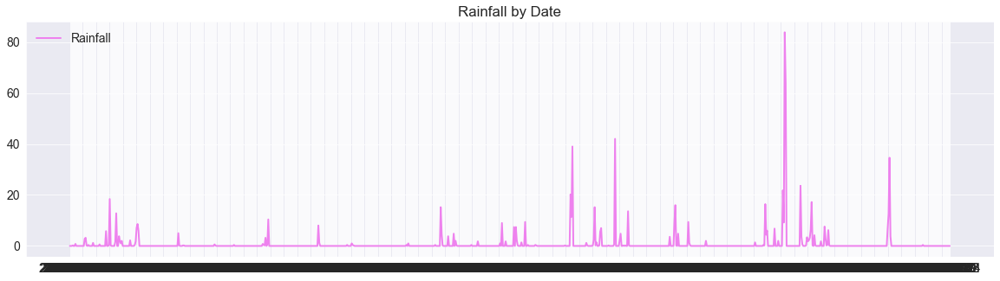

In [27]:
df_dateplot = raw_df.iloc[-950:,:]
plt.figure(figsize=[20,5])
plt.plot(df_dateplot['Date'],df_dateplot['Rainfall'],color='violet', linewidth=2, label= 'Rainfall')
plt.legend(loc='upper left', frameon=False)
plt.title('Rainfall by Date')
plt.show()

Being situated in southern hemisphere, the majority of rainfall occurs between December and March.As you can see from above plot, we can see that Dec-Jan does get a lot of rainfall but there are months like Jun-Jul when rainfall occurs too.

### 5.1.3 Visualization of WindGustSpeed By Date

<AxesSubplot:xlabel='WindGustSpeed', ylabel='Density'>

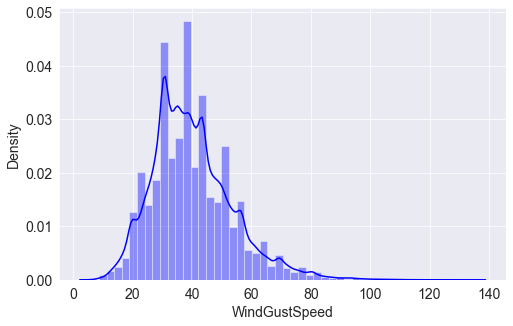

In [28]:
plt.figure(figsize=(8,5))
sns.distplot(raw_df['WindGustSpeed'], hist=True, color='blue')

Observation:-

* Wind Gust Speed ranges from 0 to nearly 140 km/hr.
* Highest concentration of points for Wind Gust Speed is between 38-40 km/hr..

### 5.1.4 Frequency distribution of RainTomorrow variable

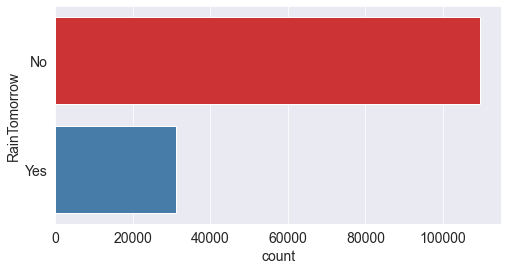

In [29]:
f, ax = plt.subplots(figsize=(8, 4))
ax = sns.countplot(y="RainTomorrow", data=raw_df, palette="Set1")
plt.show()

### 5.1.5 Findings of Univariate Analysis 

* The number of unique values in `RainTomorrow` variable is 2.

* The two unique values are `No` and `Yes`.

* Out of the total number of `RainTomorrow` values, `No` appears `77.58%` times and `Yes` appears `22.42%` times.

* The univariate plot confirms our findings that –

    * The No variable have 110316 entries, and

    * The Yes variable have 31877 entries.

## 5.2 Bivariate Analysis

Types of variables 
In this section, I segregate the dataset into categorical and numerical variables. There are a mixture of categorical and numerical variables in the dataset. Categorical variables have data type object. Numerical variables have data type float64.

First of all, I will find categorical variables.

### 5.2.1 Explore Categorical Features in a Data set



In [30]:
categorical = [var for var in raw_df.columns if raw_df[var].dtype=='O']

print('There are {} categorical variables\n'.format(len(categorical)))

print('The categorical variables are :', categorical)

There are 7 categorical variables

The categorical variables are : ['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


##### View the categorical variables

In [31]:
raw_df[categorical].head()

,Date,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,W,W,WNW,No,No
1,2008-12-02,Albury,WNW,NNW,WSW,No,No
2,2008-12-03,Albury,WSW,W,WSW,No,No
3,2008-12-04,Albury,NE,SE,E,No,No
4,2008-12-05,Albury,W,ENE,NW,No,No


#####  Summary of categorical variables 

* There is a date variable. It is denoted by `Date` column.
* There are 6 categorical variables. These are given by `Location`, `WindGustDir`, `WindDir9am`, `WindDir3pm`, `RainToday` and `RainTomorrow`.
* There are two binary categorical variables - `RainToday` and `RainTomorrow`.
* `RainTomorrow` is the `target variable`.

### 5.2.2 Explore problems within categorical variables

First, I will explore the categorical variables.

#### Missing values in categorical variables

In [32]:
raw_df[categorical].isnull().sum()

Date               0
Location           0
WindGustDir     9163
WindDir9am      9660
WindDir3pm      3670
RainToday          0
RainTomorrow       0
dtype: int64

#### Print categorical variables containing missing values

In [33]:
cat1 = [var for var in categorical if raw_df[var].isnull().sum()!=0]

print(raw_df[cat1].isnull().sum())

WindGustDir    9163
WindDir9am     9660
WindDir3pm     3670
dtype: int64


We can see that there are only 3 categorical variables in the dataset which contains missing values. These are `WindGustDir`, `WindDir9am`and `WindDir3pm` .



Now, I will check the frequency counts of categorical variables.

####  View frequency of categorical variables

In [34]:
for var in categorical: 
    
    print(raw_df[var].value_counts())

2013-06-03    49
2014-07-15    49
2014-05-28    49
2016-07-01    49
2014-01-14    49
              ..
2007-12-28     1
2007-11-18     1
2007-11-03     1
2008-01-28     1
2007-11-09     1
Name: Date, Length: 3436, dtype: int64
Canberra            3402
Sydney              3331
Perth               3193
Darwin              3192
Hobart              3183
Brisbane            3132
Bendigo             3030
Townsville          3027
AliceSprings        3025
MountGambier        3022
Launceston          3020
Adelaide            3020
Ballarat            3017
MelbourneAirport    3009
PerthAirport        3009
Mildura             3005
SydneyAirport       3001
Nuriootpa           2996
Albany              2996
Sale                2992
Albury              2991
Watsonia            2990
Woomera             2984
Portland            2984
Cobar               2980
Cairns              2964
Tuggeranong         2959
WaggaWagga          2958
NorfolkIsland       2944
Wollongong          2943
SalmonGums          2941

####  View frequency distribution of categorical variables

In [35]:
for var in categorical: 
    
    print(raw_df[var].value_counts()/np.float(len(raw_df)))

2013-06-03    0.000348
2014-07-15    0.000348
2014-05-28    0.000348
2016-07-01    0.000348
2014-01-14    0.000348
                ...   
2007-12-28    0.000007
2007-11-18    0.000007
2007-11-03    0.000007
2008-01-28    0.000007
2007-11-09    0.000007
Name: Date, Length: 3436, dtype: float64
Canberra            0.024164
Sydney              0.023660
Perth               0.022680
Darwin              0.022673
Hobart              0.022609
Brisbane            0.022246
Bendigo             0.021522
Townsville          0.021501
AliceSprings        0.021486
MountGambier        0.021465
Launceston          0.021451
Adelaide            0.021451
Ballarat            0.021430
MelbourneAirport    0.021373
PerthAirport        0.021373
Mildura             0.021344
SydneyAirport       0.021316
Nuriootpa           0.021280
Albany              0.021280
Sale                0.021252
Albury              0.021245
Watsonia            0.021238
Woomera             0.021195
Portland            0.021195
Cobar     

Number of labels: `Cardinality`

The number of labels within a categorical variable is known as `cardinality`. A high number of labels within a variable is known as `high cardinality`. High cardinality may pose some serious problems in the machine learning model. So, I will check for high cardinality.

### 5.2.3 Check for cardinality in categorical variables


In [36]:

for var in categorical:
    
    print(var, ' contains ', len(raw_df[var].unique()), ' labels')

Date  contains  3436  labels
Location  contains  49  labels
WindGustDir  contains  17  labels
WindDir9am  contains  17  labels
WindDir3pm  contains  17  labels
RainToday  contains  2  labels
RainTomorrow  contains  2  labels


We can see that there is a `Date` variable which needs to be`preprocessed`. we will do preprocessing in the following section.

All the other variables contain relatively smaller number of variables.



### 5.2.4 Feature Engineering of Date Variable

In [37]:
raw_df['Date'].dtypes

dtype('O')

We can see that the data type of `Date` variable is object. We will parse the date currently coded as object into `datetime` format.

#### Parse the dates, currently coded as strings, into datetime format


In [38]:
raw_df['Date'] = pd.to_datetime(raw_df['Date'])

#### Extract year from date

In [39]:
raw_df['Year'] = raw_df['Date'].dt.year

raw_df['Year'].head()

0    2008
1    2008
2    2008
3    2008
4    2008
Name: Year, dtype: int64

#### Extract month from date

In [40]:
raw_df['Month'] = raw_df['Date'].dt.month

raw_df['Month'].head()

0    12
1    12
2    12
3    12
4    12
Name: Month, dtype: int64

#### Extract day from date

In [41]:
raw_df['Day'] = raw_df['Date'].dt.day

raw_df['Day'].head()

0    1
1    2
2    3
3    4
4    5
Name: Day, dtype: int64

####  Distribution of Date

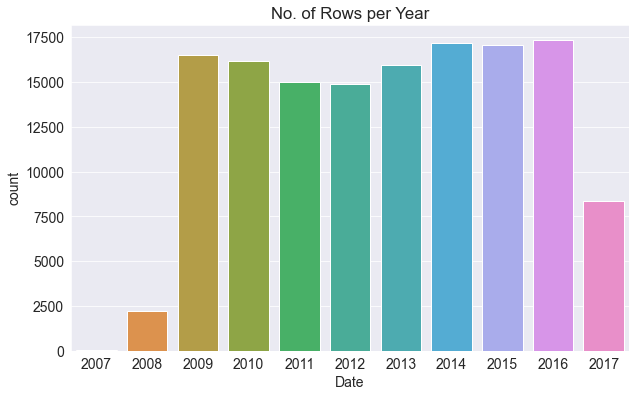

In [42]:
plt.title('No. of Rows per Year')
sns.countplot(x=pd.to_datetime(raw_df.Date).dt.year);

#### Again view the summary of dataset

We can see that there are three additional columns created from `Date` variable. Now, I will drop the original Date variable from the dataset.

####  Drop the original Date variable

In [43]:
raw_df.drop('Date', axis=1, inplace = True)


In [44]:
raw_df.head()

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,...,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,Albury,13.4,22.9,0.6,W,44.0,W,WNW,20.0,24.0,...,22.0,1007.7,1007.1,16.9,21.8,No,No,2008,12,1
1,Albury,7.4,25.1,0.0,WNW,44.0,NNW,WSW,4.0,22.0,...,25.0,1010.6,1007.8,17.2,24.3,No,No,2008,12,2
2,Albury,12.9,25.7,0.0,WSW,46.0,W,WSW,19.0,26.0,...,30.0,1007.6,1008.7,21.0,23.2,No,No,2008,12,3
3,Albury,9.2,28.0,0.0,NE,24.0,SE,E,11.0,9.0,...,16.0,1017.6,1012.8,18.1,26.5,No,No,2008,12,4
4,Albury,17.5,32.3,1.0,W,41.0,ENE,NW,7.0,20.0,...,33.0,1010.8,1006.0,17.8,29.7,No,No,2008,12,5


Now, we can see that the `Date` variable has been removed from the dataset.

### 5.2.5 Explore Categorical Variables one by one

Now, We will explore the categorical variables one by one.

#### Find categorical variables

In [45]:
categorical = [var for var in raw_df.columns if raw_df[var].dtype=='O']

print('There are {} categorical variables\n'.format(len(categorical)))

print('The categorical variables are :', categorical)

There are 6 categorical variables

The categorical variables are : ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


We can see that there are 6 categorical variables in the dataset. The Date variable has been removed. First, I will check missing values in categorical variables.

#### Check for missing values in categorical variables 

In [46]:
raw_df[categorical].isnull().sum()

Location           0
WindGustDir     9163
WindDir9am      9660
WindDir3pm      3670
RainToday          0
RainTomorrow       0
dtype: int64

We can see that `WindGustDir`, `WindDir9am`and `WindDir3pm` variables contain missing values. I will explore these variables one by one.

### i) Explore Location variable

#### Print number of labels in Location variable


In [47]:
raw_df.Location.nunique() # will tell how many locations do we have 

49

#### Check labels in location variable

In [48]:
raw_df.Location.unique()

array(['Albury', 'BadgerysCreek', 'Cobar', 'CoffsHarbour', 'Moree',
       'Newcastle', 'NorahHead', 'NorfolkIsland', 'Penrith', 'Richmond',
       'Sydney', 'SydneyAirport', 'WaggaWagga', 'Williamtown',
       'Wollongong', 'Canberra', 'Tuggeranong', 'MountGinini', 'Ballarat',
       'Bendigo', 'Sale', 'MelbourneAirport', 'Melbourne', 'Mildura',
       'Nhil', 'Portland', 'Watsonia', 'Dartmoor', 'Brisbane', 'Cairns',
       'GoldCoast', 'Townsville', 'Adelaide', 'MountGambier', 'Nuriootpa',
       'Woomera', 'Albany', 'Witchcliffe', 'PearceRAAF', 'PerthAirport',
       'Perth', 'SalmonGums', 'Walpole', 'Hobart', 'Launceston',
       'AliceSprings', 'Darwin', 'Katherine', 'Uluru'], dtype=object)

#### Check frequency distribution of values in Location variable

In [49]:
raw_df.Location.value_counts()

Canberra            3402
Sydney              3331
Perth               3193
Darwin              3192
Hobart              3183
Brisbane            3132
Bendigo             3030
Townsville          3027
AliceSprings        3025
MountGambier        3022
Launceston          3020
Adelaide            3020
Ballarat            3017
MelbourneAirport    3009
PerthAirport        3009
Mildura             3005
SydneyAirport       3001
Nuriootpa           2996
Albany              2996
Sale                2992
Albury              2991
Watsonia            2990
Woomera             2984
Portland            2984
Cobar               2980
Cairns              2964
Tuggeranong         2959
WaggaWagga          2958
NorfolkIsland       2944
Wollongong          2943
SalmonGums          2941
CoffsHarbour        2940
Dartmoor            2939
Newcastle           2929
GoldCoast           2924
Witchcliffe         2924
Penrith             2911
Richmond            2906
NorahHead           2888
BadgerysCreek       2877


####  One Hot Encoding of Location variable

Since machine learning models can only be trained with numeric data, we need to convert categorical data to numbers. A common technique is to use one-hot encoding for categorical columns.One hot encoding involves adding a new binary (0/1) column for each unique category of a categorical column.

* Get k-1 dummy variables after One Hot Encoding 
* Preview the dataset with head() method

In [50]:
pd.get_dummies(raw_df.Location, drop_first=True).head()

,Albany,Albury,AliceSprings,BadgerysCreek,Ballarat,Bendigo,Brisbane,Cairns,Canberra,Cobar,...,Townsville,Tuggeranong,Uluru,WaggaWagga,Walpole,Watsonia,Williamtown,Witchcliffe,Wollongong,Woomera
0,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### Distribution of location

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]),
 [Text(0, 0, 'Albury'),
  Text(1, 0, 'BadgerysCreek'),
  Text(2, 0, 'Cobar'),
  Text(3, 0, 'CoffsHarbour'),
  Text(4, 0, 'Moree'),
  Text(5, 0, 'Newcastle'),
  Text(6, 0, 'NorahHead'),
  Text(7, 0, 'NorfolkIsland'),
  Text(8, 0, 'Penrith'),
  Text(9, 0, 'Richmond'),
  Text(10, 0, 'Sydney'),
  Text(11, 0, 'SydneyAirport'),
  Text(12, 0, 'WaggaWagga'),
  Text(13, 0, 'Williamtown'),
  Text(14, 0, 'Wollongong'),
  Text(15, 0, 'Canberra'),
  Text(16, 0, 'Tuggeranong'),
  Text(17, 0, 'MountGinini'),
  Text(18, 0, 'Ballarat'),
  Text(19, 0, 'Bendigo'),
  Text(20, 0, 'Sale'),
  Text(21, 0, 'MelbourneAirport'),
  Text(22, 0, 'Melbourne'),
  Text(23, 0, 'Mildura'),
  Text(24, 0, 'Nhil'),
  Text(25, 0, 'Portland'),
  Text(26, 0, 'Watsonia'),
  Text(27, 0, 'Dartmoor'),
  Text(28,

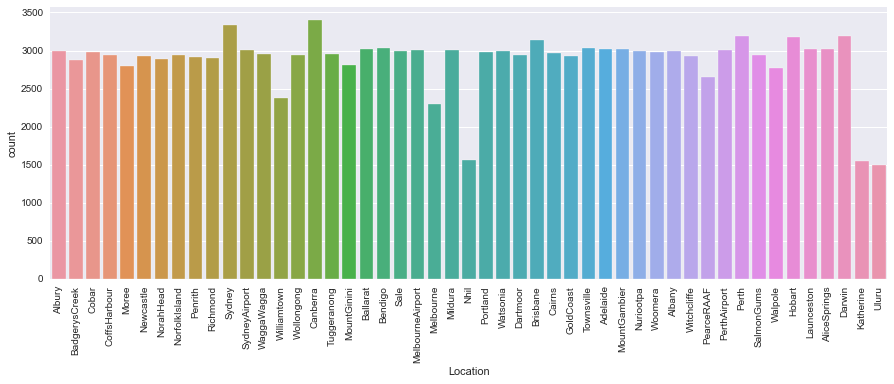

In [51]:
plt.style.use('seaborn')
plt.figure(figsize=(15, 5))
sns.countplot(raw_df['Location'])
plt.xticks(rotation=90)

Observation:-

* Most occured location is Canberra followed by Sydney.
* Most of the locations have a frequency near 3000.
* Nhil, Katherine and Uluru have occured the least.

### ii) Explore WindGustDir variable

#### Print number of labels in WindGustDir variable

In [52]:
print('WindGustDir contains', len(raw_df['WindGustDir'].unique()), 'labels')

WindGustDir contains 17 labels


#### Check labels in WindGustDir variable

In [53]:
raw_df['WindGustDir'].unique()

array(['W', 'WNW', 'WSW', 'NE', 'NNW', 'N', 'NNE', 'SW', 'ENE', 'SSE',
       'S', 'NW', 'SE', 'ESE', nan, 'E', 'SSW'], dtype=object)

#### Check frequency distribution of values in WindGustDir variable

In [54]:
raw_df.WindGustDir.value_counts()

W      9696
SE     9241
E      8985
N      8941
SSE    8905
S      8859
WSW    8802
SW     8702
SSW    8541
WNW    7960
NW     7939
ENE    7924
ESE    7244
NE     7002
NNW    6511
NNE    6372
Name: WindGustDir, dtype: int64

####  One Hot Encoding of WindGustDir variable

Since machine learning models can only be trained with numeric data, we need to convert categorical data to numbers.

* Get k-1 dummy variables after One Hot Encoding 
* Also add an additional dummy variable to indicate there was missing data
* Preview the dataset with head() method



In [55]:
pd.get_dummies(raw_df.WindGustDir, drop_first=True, dummy_na=True).head()


,ENE,ESE,N,NE,NNE,NNW,NW,S,SE,SSE,SSW,SW,W,WNW,WSW,NaN
0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


* Sum the number of 1s per boolean variable over the rows of the dataset
* It will tell us how many observations we have for each category


In [56]:
pd.get_dummies(raw_df.WindGustDir, drop_first=True, dummy_na=True).sum(axis=0)

ENE    7924
ESE    7244
N      8941
NE     7002
NNE    6372
NNW    6511
NW     7939
S      8859
SE     9241
SSE    8905
SSW    8541
SW     8702
W      9696
WNW    7960
WSW    8802
NaN    9163
dtype: int64

We can see that there are 9163 missing values in `WindGustDir` variable

In [57]:
from windrose import WindroseAxes

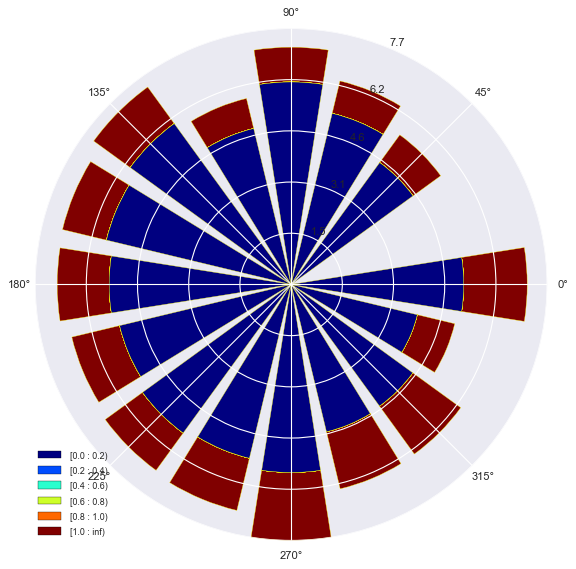

In [58]:
# create a dict for WindGustDir to numeric values
wind_dir = ['E', 'ENE', 'NE', 'NNE', 'N', 'NNE', 'NW', 'WNW', 'W', 'WSW', 'SW', 'SSW', 'S', 'SSE', 'SE', 'ESE']
degrees = np.arange(0, 360, 22.5)
wind_dir_deg = dict((zip(wind_dir, degrees)))

# plot and map WindGustDir to the dict

ax = WindroseAxes.from_ax()
ax.bar(direction=raw_df.WindGustDir.map(wind_dir_deg), var=raw_df.RainTomorrow.map({'No': 0, 'Yes': 1}), normed=True, opening=0.8, edgecolor='Yellow')
#ax.bar(direction=raw_df.WindGustDir.map(wind_dir_deg), var=raw_df.Rainfall, normed=True, opening=0.8, edgecolor='white')
ax.set_legend()

### iii) Explore WindDir9am variable

#### Print number of labels in WindDir9am variable

In [59]:
print('WindDir9am contains', len(raw_df['WindDir9am'].unique()), 'labels')

WindDir9am contains 17 labels


#### Check labels in WindDir9am variable

In [60]:
raw_df['WindDir9am'].unique()

array(['W', 'NNW', 'SE', 'ENE', 'SW', 'SSE', 'S', 'NE', 'SSW', 'N', 'WSW',
       'ESE', 'E', nan, 'NW', 'WNW', 'NNE'], dtype=object)

#### Check frequency distribution of values in WindDir9am variable


In [61]:
raw_df['WindDir9am'].value_counts()

N      11266
SE      9116
E       8977
SSE     8901
NW      8471
S       8424
W       8207
SW      8160
NNE     7877
NNW     7782
ENE     7668
ESE     7518
NE      7477
SSW     7397
WNW     7100
WSW     6786
Name: WindDir9am, dtype: int64

####  One Hot Encoding of WindDir9am variable

Since machine learning models can only be trained with numeric data, we need to convert categorical data to numbers.

* Get k-1 dummy variables after One Hot Encoding 
* Also add an additional dummy variable to indicate there was missing data
* Preview the dataset with head() method


In [62]:
pd.get_dummies(raw_df.WindDir9am, drop_first=True, dummy_na=True).head()

,ENE,ESE,N,NE,NNE,NNW,NW,S,SE,SSE,SSW,SW,W,WNW,WSW,NaN
0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


* Sum the number of 1s per boolean variable over the rows of the dataset
* It will tell us how many observations we have for each category


In [63]:
pd.get_dummies(raw_df.WindDir9am, drop_first=True, dummy_na=True).sum(axis=0)

ENE     7668
ESE     7518
N      11266
NE      7477
NNE     7877
NNW     7782
NW      8471
S       8424
SE      9116
SSE     8901
SSW     7397
SW      8160
W       8207
WNW     7100
WSW     6786
NaN     9660
dtype: int64

We can see that there are `9660` missing values in the WindDir9am variable.

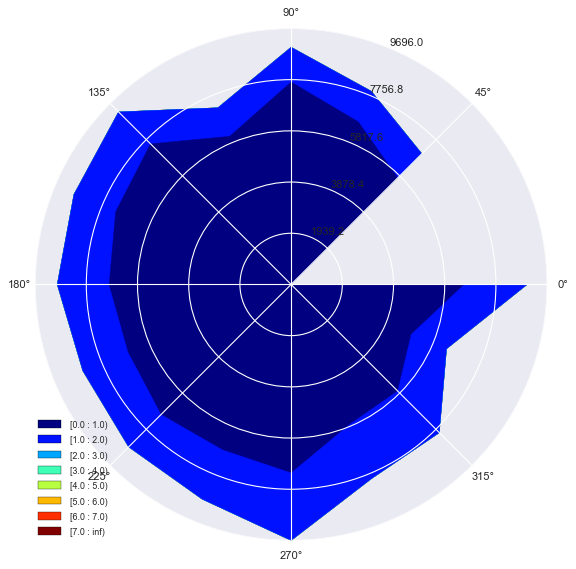

In [64]:
# create a dict for WindGustDir to numeric values

WindDir9am  =['W', 'NNW', 'SE', 'ENE', 'SW', 'SSE', 'S', 'NE', 'SSW', 'N', 'WSW','ESE', 'E',  'NW', 'WNW', 'NNE']
degrees = np.arange(0, 360, 22.5)
WindDir9am_deg = dict((zip(WindDir9am , degrees)))

# plot and map WindGustDir to the dict

ax = WindroseAxes.from_ax()
ax.contourf(direction=raw_df.WindGustDir.map(wind_dir_deg), var=raw_df.RainTomorrow.map({'No': 0, 'Yes': 1}),  bins=np.arange(0, 8, 1))
#ax.bar(direction=raw_df.WindGustDir.map(wind_dir_deg), var=raw_df.Rainfall, normed=True, opening=0.8, edgecolor='white')
ax.set_legend()

### iv) Explore WindDir3pm variable

#### Print number of labels in WindDir3pm variable

In [65]:
print('WindDir3pm contains', len(raw_df['WindDir3pm'].unique()), 'labels')

WindDir3pm contains 17 labels


#### Check labels in WindDir3pm variable

In [66]:
raw_df['WindDir3pm'].unique()

array(['WNW', 'WSW', 'E', 'NW', 'W', 'SSE', 'ESE', 'ENE', 'NNW', 'SSW',
       'SW', 'SE', 'N', 'S', 'NNE', nan, 'NE'], dtype=object)

#### Check frequency distribution of values in WindDir3pm variable

In [67]:
raw_df['WindDir3pm'].value_counts()

SE     10578
W       9810
S       9488
WSW     9231
SW      9104
SSE     9038
N       8593
WNW     8564
NW      8394
ESE     8311
E       8272
NE      8107
SSW     7945
NNW     7664
ENE     7645
NNE     6373
Name: WindDir3pm, dtype: int64

####  One Hot Encoding of WindDir3pm variable

Since machine learning models can only be trained with numeric data, we need to convert categorical data to numbers.

* Get k-1 dummy variables after One Hot Encoding 
* Also add an additional dummy variable to indicate there was missing data
* Preview the dataset with head() method


In [68]:
pd.get_dummies(raw_df.WindDir3pm, drop_first=True, dummy_na=True).head()

,ENE,ESE,N,NE,NNE,NNW,NW,S,SE,SSE,SSW,SW,W,WNW,WSW,NaN
0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


* Sum the number of 1s per boolean variable over the rows of the dataset
* It will tell us how many observations we have for each category


In [69]:
pd.get_dummies(raw_df.WindDir3pm, drop_first=True, dummy_na=True).sum(axis=0)

ENE     7645
ESE     8311
N       8593
NE      8107
NNE     6373
NNW     7664
NW      8394
S       9488
SE     10578
SSE     9038
SSW     7945
SW      9104
W       9810
WNW     8564
WSW     9231
NaN     3670
dtype: int64

There are `3670` missing values in the WindDir3pm variable.

### v) Explore RainToday variable

#### Print number of labels in RainToday variable

In [70]:
print('RainToday contains', len(raw_df['RainToday'].unique()), 'labels')

RainToday contains 2 labels


#### Check labels in WindGustDir variable

In [71]:
raw_df['RainToday'].unique()

array(['No', 'Yes'], dtype=object)

#### Check frequency distribution of values in WindGustDir variable

In [72]:
raw_df.RainToday.value_counts()

No     109332
Yes     31455
Name: RainToday, dtype: int64

####  One Hot Encoding of RainToday variable

Since machine learning models can only be trained with numeric data, we need to convert categorical data to numbers.

* Get k-1 dummy variables after One Hot Encoding 
* Also add an additional dummy variable to indicate there was missing data
* Preview the dataset with head() method

In [73]:
pd.get_dummies(raw_df.RainToday, drop_first=True, dummy_na=True).head()

,Yes,NaN
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0


* sum the number of 1s per boolean variable over the rows of the dataset
* it will tell us how many observations we have for each category

In [74]:
pd.get_dummies(raw_df.RainToday, drop_first=True, dummy_na=True).sum(axis=0)

Yes    31455
NaN        0
dtype: int64

There is no missing values in the `RainToday` variable.

####  Analyzing RainToday and RainTomorrow

(array([     0.,  20000.,  40000.,  60000.,  80000., 100000.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

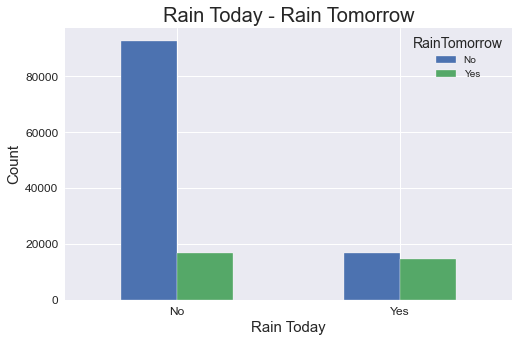

In [75]:
type_plt = pd.crosstab(raw_df['RainToday'], raw_df['RainTomorrow'])

plt.rcParams["figure.figsize"] = (8,5)

type_plt.plot(kind='bar',stacked=False)

plt.xlabel('Rain Today', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.title('Rain Today - Rain Tomorrow', fontsize=20)
plt.xticks(rotation=0, fontsize=12)
plt.yticks(fontsize=12)

Observation:-

1. For maximum records it didn't rain for both days.
2. For nearly 20,000 records it didn't rain today but rained tomorrow and rained for both days.
3. For nearly 20,000 records it rained today but didn't rain tomorrow.


## 5.2.6 Explore Numerical Variables 

#### Find numerical variables

In [76]:
numerical = [var for var in raw_df.columns if raw_df[var].dtype!='O']

print('There are {} numerical variables\n'.format(len(numerical)))

print('The numerical variables are :', numerical)

There are 15 numerical variables

The numerical variables are : ['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm', 'Year', 'Month', 'Day']


####  View the numerical variables

In [77]:
raw_df[numerical].head()

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,Year,Month,Day
0,13.4,22.9,0.6,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,16.9,21.8,2008,12,1
1,7.4,25.1,0.0,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,17.2,24.3,2008,12,2
2,12.9,25.7,0.0,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,21.0,23.2,2008,12,3
3,9.2,28.0,0.0,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,18.1,26.5,2008,12,4
4,17.5,32.3,1.0,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,17.8,29.7,2008,12,5


#### Summary of numerical variables 

* There are 19 numerical variables.
* These are given by MinTemp, MaxTemp, Rainfall, Evaporation, Sunshine, WindGustSpeed, WindSpeed9am, WindSpeed3pm, Humidity9am, * Humidity3pm, Pressure9am, Pressure3pm, Cloud9am, Cloud3pm, Temp9am and Temp3pm.

All of the numerical variables are of continuous type.

#### Missing values in numerical variables

In [78]:
raw_df[numerical].isnull().sum()

MinTemp            468
MaxTemp            307
Rainfall             0
WindGustSpeed     9105
WindSpeed9am      1055
WindSpeed3pm      2531
Humidity9am       1517
Humidity3pm       3501
Pressure9am      13743
Pressure3pm      13769
Temp9am            656
Temp3pm           2624
Year                 0
Month                0
Day                  0
dtype: int64

We can see that all the 15 numerical variables contain missing values. In this sense, the variables `Sunshine`, `Evaporation`, `Cloud3pm`, `Cloud9am` are those that effectively have more missing values, therefore we eliminated such variables from the data set.

## 5.2.7 Outliers in numerical variables

#### View summary statistics in numerical variables


In [79]:
print(raw_df.describe())

             MinTemp       MaxTemp       Rainfall  WindGustSpeed  \
count  140319.000000  140480.00000  140787.000000  131682.000000   
mean       12.184824      23.23512       2.349974      39.970520   
std         6.403879       7.11450       8.465173      13.578201   
min        -8.500000      -4.80000       0.000000       6.000000   
25%         7.600000      17.90000       0.000000      31.000000   
50%        12.000000      22.60000       0.000000      39.000000   
75%        16.800000      28.30000       0.800000      48.000000   
max        33.900000      48.10000     371.000000     135.000000   

        WindSpeed9am   WindSpeed3pm    Humidity9am    Humidity3pm  \
count  139732.000000  138256.000000  139270.000000  137286.000000   
mean       13.990496      18.631141      68.826833      51.449288   
std         8.886210       8.798096      19.063650      20.807310   
min         0.000000       0.000000       0.000000       0.000000   
25%         7.000000      13.000000      5

On closer inspection, we can see that the `Rainfall`,  `WindSpeed9am` and `WindSpeed3pm` columns may contain outliers.

I will draw boxplots to visualise outliers in the above variables.

###   Draw boxplots to visualize outliers

Text(0, 0.5, 'WindSpeed3pm')

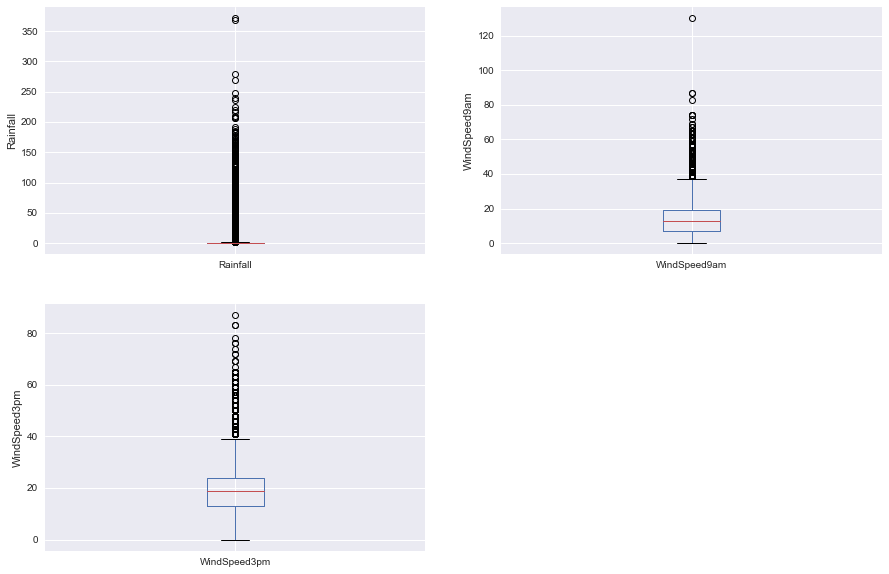

In [80]:
plt.figure(figsize=(15,10))


plt.subplot(2, 2, 1)
fig = raw_df.boxplot(column='Rainfall')
fig.set_title('')
fig.set_ylabel('Rainfall')

plt.subplot(2, 2, 2)
fig = raw_df.boxplot(column='WindSpeed9am')
fig.set_title('')
fig.set_ylabel('WindSpeed9am')


plt.subplot(2, 2,3)
fig = raw_df.boxplot(column='WindSpeed3pm')
fig.set_title('')
fig.set_ylabel('WindSpeed3pm')

The above boxplots confirm that there are lot of `outliers` in these variables.

#### Check the distribution of variables
* Now, I will plot the `histograms` to check distributions to find out if they are `normal` or `skewed`.

* If the variable follows `normal distribution`, then I will do `Extreme Value Analysis` otherwise if they are `skewed`, I will find `IQR (Interquantile range)`.

### 5.2.8  Plot histogram to check distribution

Text(0, 0.5, 'RainTomorrow')

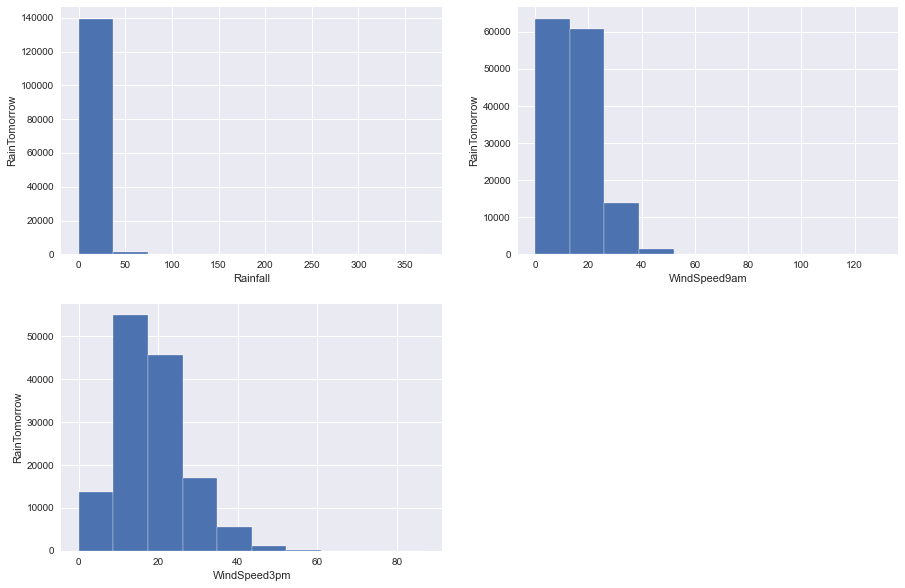

In [81]:
plt.figure(figsize=(15,10))


plt.subplot(2, 2, 1)
fig = raw_df.Rainfall.hist(bins=10)
fig.set_xlabel('Rainfall')
fig.set_ylabel('RainTomorrow')


plt.subplot(2, 2, 2)
fig = raw_df.WindSpeed9am.hist(bins=10)
fig.set_xlabel('WindSpeed9am')
fig.set_ylabel('RainTomorrow')


plt.subplot(2, 2, 3)
fig = raw_df.WindSpeed3pm.hist(bins=10)
fig.set_xlabel('WindSpeed3pm')
fig.set_ylabel('RainTomorrow')

We can see that all the four variables are `skewed`. So, We will use `interquantile range` to find `outliers`.

### 5.2.9 Find outliers for Rainfall variable

In [82]:
IQR = raw_df.Rainfall.quantile(0.75) - raw_df.Rainfall.quantile(0.25)
Lower_fence = raw_df.Rainfall.quantile(0.25) - (IQR * 3)
Upper_fence = raw_df.Rainfall.quantile(0.75) + (IQR * 3)
print('Rainfall outliers are values < {lowerboundary} or > {upperboundary}'.format(lowerboundary=Lower_fence, upperboundary=Upper_fence))

Rainfall outliers are values < -2.4000000000000004 or > 3.2


For `Rainfall`, the `minimum` and `maximum` values are `0.0` and `371.0`. So, the `outliers` are values > `3.2`.

### 5.2.10 Find outliers for WindSpeed9am variable

In [83]:
IQR = raw_df.WindSpeed9am.quantile(0.75) - raw_df.WindSpeed9am.quantile(0.25)
Lower_fence = raw_df.WindSpeed9am.quantile(0.25) - (IQR * 3)
Upper_fence = raw_df.WindSpeed9am.quantile(0.75) + (IQR * 3)
print('WindSpeed9am outliers are values < {lowerboundary} or > {upperboundary}'.format(lowerboundary=Lower_fence, upperboundary=Upper_fence))

WindSpeed9am outliers are values < -29.0 or > 55.0


For `WindSpeed9am`, the `minimum` and `maximum` values are `0.0` and `130.0`. So, the `outliers` are values > `55.0`.

### 5.2.11  Find outliers for WindSpeed3pm variable


In [84]:
IQR = raw_df.WindSpeed3pm.quantile(0.75) - raw_df.WindSpeed3pm.quantile(0.25)
Lower_fence = raw_df.WindSpeed3pm.quantile(0.25) - (IQR * 3)
Upper_fence = raw_df.WindSpeed3pm.quantile(0.75) + (IQR * 3)
print('WindSpeed3pm outliers are values < {lowerboundary} or > {upperboundary}'.format(lowerboundary=Lower_fence, upperboundary=Upper_fence))

WindSpeed3pm outliers are values < -20.0 or > 57.0


For `WindSpeed3pm`, the `minimum` and `maximum` values are `0.0` and `87.0`. So, the `outliers` are values > `57.0`.

## 5.3 Comparison of  Columns Using Visualization

### 5.3.1 Location vs Rainy Days

In [85]:
px.histogram(raw_df, x ='Location' , title = 'Location vs Rainy Days' , color = 'RainToday')

#### Interpretation

For almost every location we have value of around `3000`. For some of locations value is lower probably data may have lost or not collected. We getting a sense that we having mostly a `Uniform distribution` across different locations. I have split the bars to show weather the value of `RainToday` is No or Yes. About `15-20 %` of days in pretty much every there was rain and in `70-80%` there was no rain.So Location definetly seems to be factor that decides how much rain there is goint to be.


Forming a `Gaussian distribution`.If temperature at 3pm is low temperature then it might rain tomorrow and with high temperature it might no rain tomorrow. If temperature is lower it seem more likely it will rain and there are decent example where temperature is high then also raining.

### 5.3.2 Distribution of MinTemp and MaxTemp

Text(0.5, 1.0, 'Maximum Temperature')

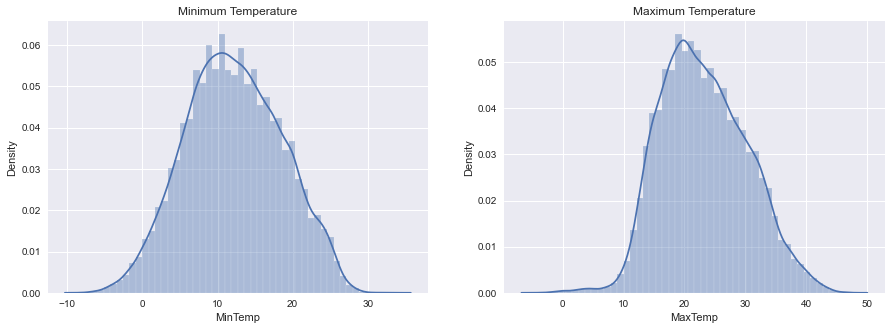

In [86]:
fig, ax = plt.subplots(1, 2, figsize=(15,5))

# MinTemp
sns.distplot(raw_df['MinTemp'], ax=ax[0])
ax[0].set_title("Minimum Temperature")

# MaxTemp
sns.distplot(raw_df['MaxTemp'], ax=ax[1])
ax[1].set_title("Maximum Temperature")

Observation:-

* Highest concentration of points for minimum temperature is between 10 to 12 degree Celcius.
* Highest concentration of points for maximum temperature is between 18 to 22 degree Celcius.

### 5.3.3 MinTemp and MaxTemp of each location

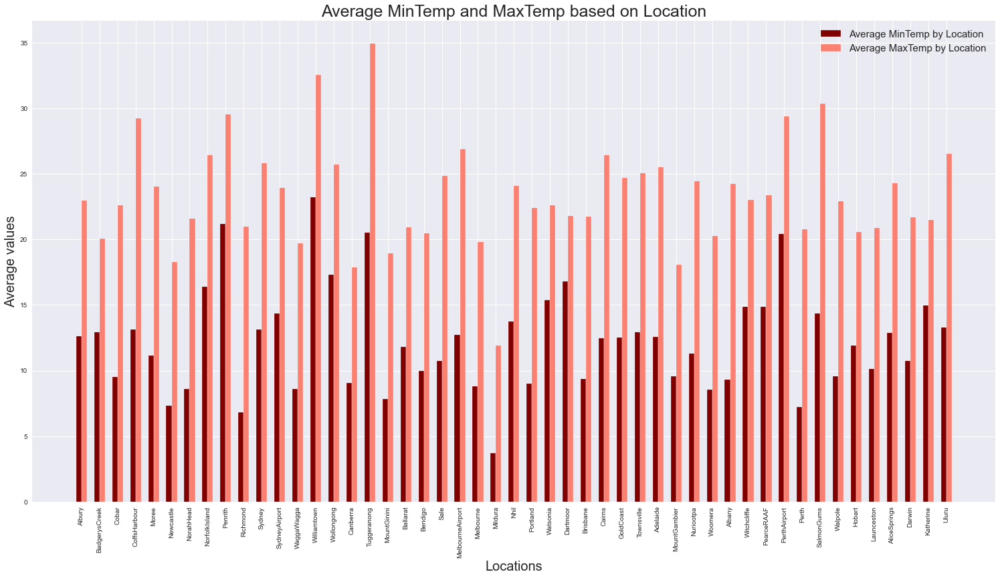

In [87]:
a = raw_df.groupby('Location').agg({'MinTemp':'mean'})
c = raw_df.groupby('Location').agg({'MaxTemp':'mean'})
plt.rcParams["figure.figsize"] = (20,10)

n = raw_df['Location'].nunique()
x = np.arange(n)

loc = raw_df['Location'].unique()

fig = plt.figure()
ax = fig.add_axes([0, 0, 1, 1])

w = 0.3

ax.bar(x-w/2, a[:]['MinTemp'], label='Average MinTemp by Location', color='maroon', width=w)
ax.bar(x+w/2, c[:]['MaxTemp'], label='Average MaxTemp by Location', color='salmon', width=w)

ax.set_xticks(x)
ax.set_xticklabels(loc, rotation=90)

plt.xlabel('Locations', fontsize=20)
plt.ylabel('Average values', fontsize=20)
plt.title('Average MinTemp and MaxTemp based on Location', fontsize=25)
plt.legend(fontsize=15)

Observation:-

* The average maximum temperature is above 20 degree Celcius for most locations.
* The average minimum temperature is between 5 and 15 degree Celcius for most locations.

### 5.3.4 Distribution of WindGustDir, WindDir9am and WindDir3pm

Text(0.5, 1.0, 'Wind Direction at 3PM')

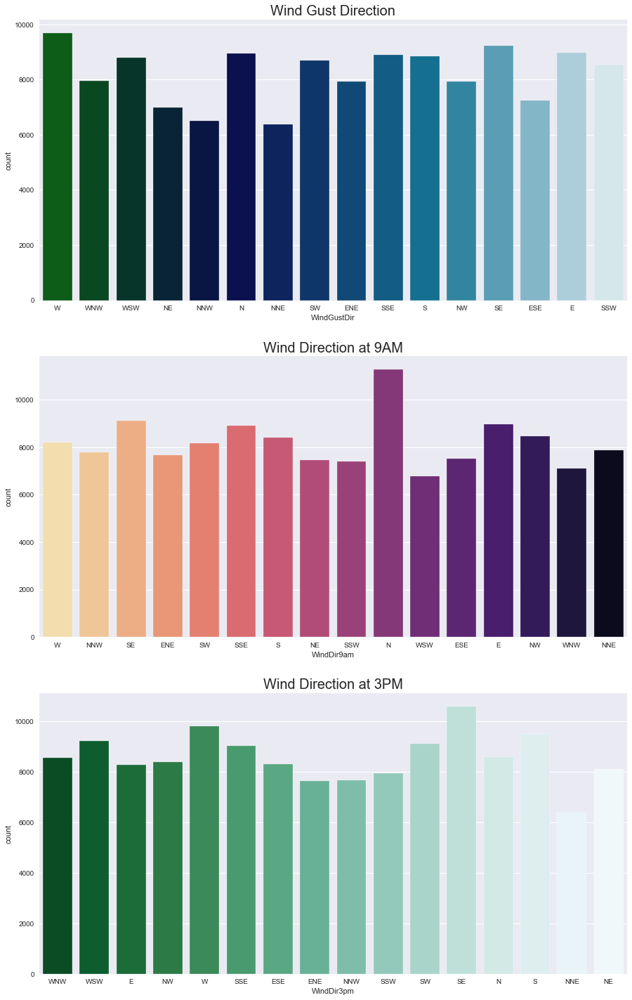

In [88]:
fig, ax = plt.subplots(3, 1, figsize=(15,25))

# WindGustDir
sns.countplot(raw_df['WindGustDir'], palette='ocean', ax=ax[0])
ax[0].set_title("Wind Gust Direction", fontsize=20)

# WindGustDir
sns.countplot(raw_df['WindDir9am'], palette='magma_r', ax=ax[1])
ax[1].set_title("Wind Direction at 9AM", fontsize=20)

# WindGustDir
sns.countplot(raw_df['WindDir3pm'], palette='BuGn_r', ax=ax[2])
ax[2].set_title("Wind Direction at 3PM", fontsize=20)

Observation:-

* Wind Gust Direction for maximum records(nearly 17,500) is West.
* Wind Direction at 9AM for maximum records is North followed by North-West and East.
* Wind Direction at 3PM for maximum records is South East.

### 5.3.5 Distribution of WindSpeed9am, WindSpeed3pm, Humidity9am, Humidity3pm, Pressure9am, Pressure3pm, Temp9am, Temp3pm

Text(0.5, 1.0, 'Temperature at 3PM')

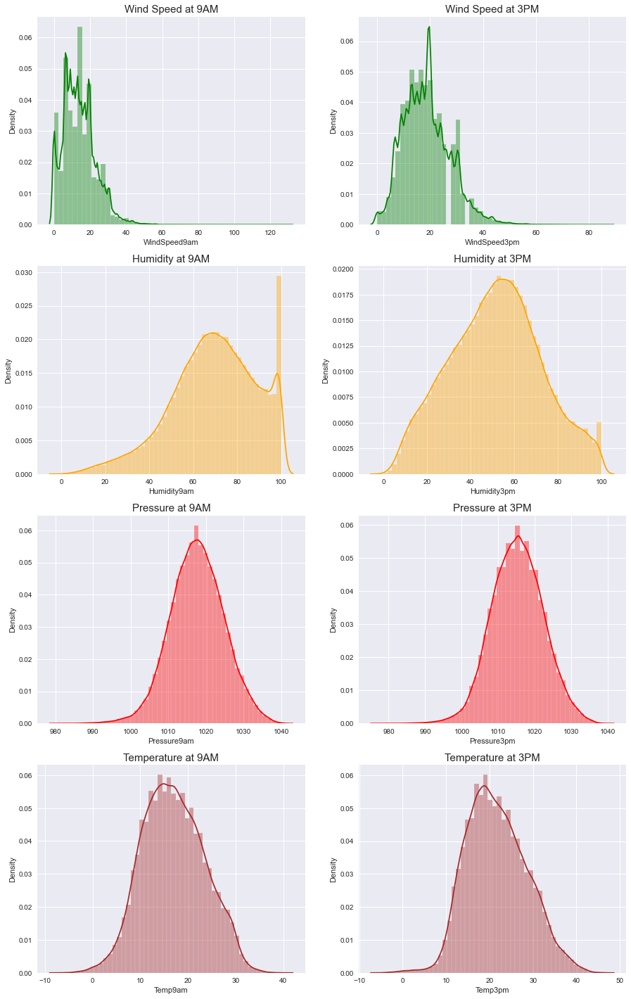

In [89]:
fig, ax = plt.subplots(4, 2, figsize=(15,25))

# WindSpeed9am
sns.distplot(raw_df['WindSpeed9am'], ax=ax[0,0], color='green')
ax[0,0].set_title("Wind Speed at 9AM", fontsize=15)

# WindSpeed3pm
sns.distplot(raw_df['WindSpeed3pm'], ax=ax[0,1], color='green')
ax[0,1].set_title("Wind Speed at 3PM", fontsize=15)

# Humidity9am
sns.distplot(raw_df['Humidity9am'], ax=ax[1,0], color='orange')
ax[1,0].set_title("Humidity at 9AM", fontsize=15)

# Humidity3pm
sns.distplot(raw_df['Humidity3pm'], ax=ax[1,1], color='orange')
ax[1,1].set_title("Humidity at 3PM", fontsize=15)

# Pressure9am
sns.distplot(raw_df['Pressure9am'], ax=ax[2,0], color='red')
ax[2,0].set_title("Pressure at 9AM", fontsize=15)

# Pressure3pm
sns.distplot(raw_df['Pressure3pm'], ax=ax[2,1], color='red')
ax[2,1].set_title("Pressure at 3PM", fontsize=15)

# Temp9am
sns.distplot(raw_df['Temp9am'], ax=ax[3,0], color='brown')
ax[3,0].set_title("Temperature at 9AM", fontsize=15)

# Temp3pm
sns.distplot(raw_df['Temp3pm'], ax=ax[3,1], color='brown')
ax[3,1].set_title("Temperature at 3PM", fontsize=15)

#### Observation:-

* Maximum wind speed at 9AM ranges from 10 to 20 km/hr whereas at 3PM it ranges from 15 to 22 km/hr.
* Highest concentration of points for humidity at 9AM is between 60-80% whereas at 3PM it's 40-70%.
* Highest concentration of points for pressure at 9AM is between 1015-1018 hpa and at 3PM it's between 1015-1017 hpa.
* Maximum temperature at 9AM is between 16-18 degree Celcius and at 3PM it's between 21-23 degree Celcius.

## 5.4. Multivariate Analysis

* An important step in EDA is to discover patterns and relationships between variables in the dataset.

* I will use heat map and pair plot to discover the patterns and relationships in the dataset.

* First of all, I will draw a heat map.

In [90]:
correlation = raw_df.corr()

### 5.4.1 Heat Map

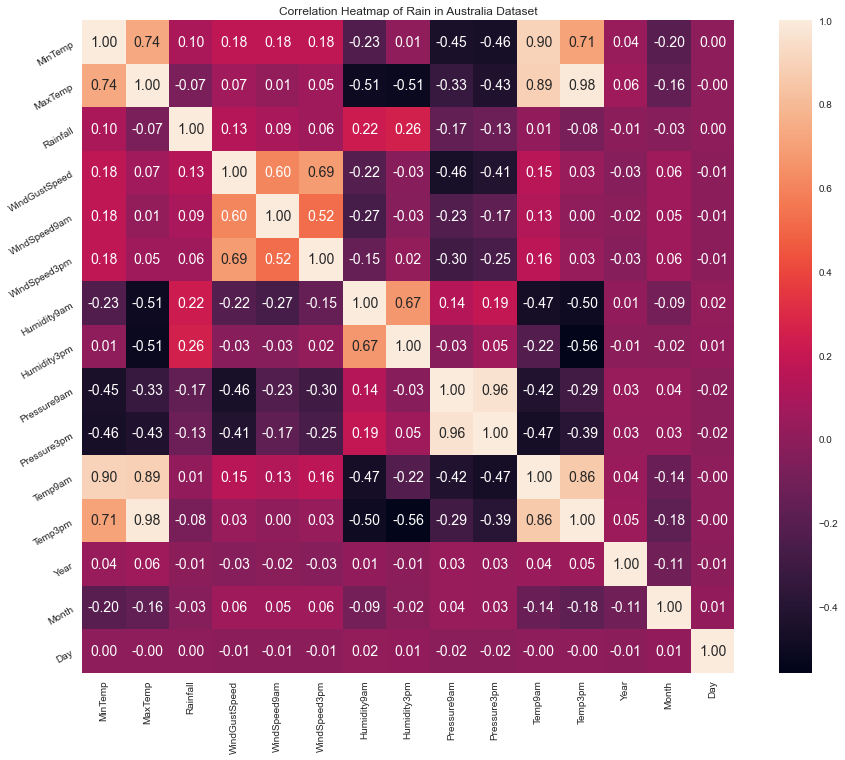

In [91]:
plt.figure(figsize=(16,12))
plt.title('Correlation Heatmap of Rain in Australia Dataset')
ax = sns.heatmap(correlation, square=True, annot=True, fmt='.2f', linecolor='white')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_yticklabels(ax.get_yticklabels(), rotation=30)           
plt.show()

#### Interpretation

From the above correlation heat map, we can conclude that :-

* MinTemp and MaxTemp variables are `highly positively` correlated (correlation coefficient = 0.74).


* MinTemp and Temp3pm variables are also `highly positively` correlated (correlation coefficient = 0.71).


* MinTemp and Temp9am variables are `strongly positively` correlated (correlation coefficient = 0.90).


* MaxTemp and Temp9am variables are `strongly positively` correlated (correlation coefficient = 0.89).


* MaxTemp and Temp3pm variables are also `strongly positively` correlated (correlation coefficient = 0.98).


* WindGustSpeed and WindSpeed3pm variables are `highly positively` correlated (correlation coefficient = 0.69).


* Pressure9am and Pressure3pm variables are `strongly positively` correlated (correlation coefficient = 0.96).


* Temp9am and Temp3pm variables are `strongly positively` correlated (correlation coefficient = 0.86).

### ---------------------------------------------------------------------------------------------------------------

# 6 Training and Test Sets

While building real-world machine learning models, it is quite common to split the dataset into  parts:

1. **Training set** - used to train the model, i.e., compute the loss and adjust the model's weights using an optimization technique. 

2. **Test set** - used to compare different models or approaches and report the model's final accuracy. For many datasets, test sets are provided separately. The test set should reflect the kind of data the model will encounter in the real-world, as closely as feasible.


<img src="https://d1m75rqqgidzqn.cloudfront.net/wp-data/2020/07/15185319/blogs-15-7-2020-02-1024x565.jpg" width="480">




As a general rule of thumb you can use around 80% of the data for the training set and 20% for the test set.


When rows in the dataset have no inherent order, it's common practice to pick random subsets of rows for creating test sets. This can be done using the `train_test_split` utility from `scikit-learn`. 

### 6.1 Declare feature vector and target variable

In [92]:
X = raw_df.drop(['RainTomorrow'], axis=1)

y = raw_df['RainTomorrow']

### 6.2  Split data into separate training and test set 

In [93]:
from sklearn.model_selection import train_test_split

Splitting entire data into training data = 80% , test data 20 %

In [94]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

Check the shape of X_train and X_test

In [95]:
X_train.shape, X_test.shape

((112629, 20), (28158, 20))

## 7. Feature Engineering 

_Feature Engineering_ is the process of transforming raw data into useful features that help us to understand our model better and increase its predictive power. I will carry out feature engineering on different types of variables.

<img src="https://www.mastersoftwaresolutions.com/wp-content/uploads/2020/01/Machine-Learning.png" width="480">


First, I will display the categorical and numerical variables again separately.

#### Check data types in X_train

In [96]:
X_train.dtypes

Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Temp9am          float64
Temp3pm          float64
RainToday         object
Year               int64
Month              int64
Day                int64
dtype: object

#### Display categorical variables

In [97]:
categorical = [col for col in X_train.columns if X_train[col].dtypes == 'O']

categorical

['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']

#### Display numerical variables

In [98]:
numerical = [col for col in X_train.columns if X_train[col].dtypes != 'O']

numerical

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Temp9am',
 'Temp3pm',
 'Year',
 'Month',
 'Day']

###  7.1 Imputing Missing Numeric Data

Machine learning models can't work with missing numerical data. The process of filling missing values is called `imputation.`
There are several techniques for imputation, but I'll use the most basic one: replacing missing values with the average value in the column using the `SimpleImputer` class from `sklearn.impute`.

<img src="https://cf3.ppt-online.org/files3/slide/d/D7zEN9sIYTWAw4XHKtlv1c65run8haFROqMJPQ/slide-4.jpg" width="480">

### 7.1.1 Engineering missing values in numerical variables 

#### Check missing values in numerical variables in X_train

In [99]:
X_train[numerical].isnull().sum()

MinTemp            366
MaxTemp            247
Rainfall             0
WindGustSpeed     7237
WindSpeed9am       857
WindSpeed3pm      2018
Humidity9am       1209
Humidity3pm       2768
Pressure9am      11007
Pressure3pm      11032
Temp9am            529
Temp3pm           2083
Year                 0
Month                0
Day                  0
dtype: int64

#### Check missing values in numerical variables in X_test

In [100]:
X_test[numerical].isnull().sum()

MinTemp           102
MaxTemp            60
Rainfall            0
WindGustSpeed    1868
WindSpeed9am      198
WindSpeed3pm      513
Humidity9am       308
Humidity3pm       733
Pressure9am      2736
Pressure3pm      2737
Temp9am           127
Temp3pm           541
Year                0
Month               0
Day                 0
dtype: int64

#### Print percentage of missing values in the numerical variables in training set

In [101]:
for col in numerical:
    if X_train[col].isnull().mean()>0:
        print(col, round(X_train[col].isnull().mean(),4))

MinTemp 0.0032
MaxTemp 0.0022
WindGustSpeed 0.0643
WindSpeed9am 0.0076
WindSpeed3pm 0.0179
Humidity9am 0.0107
Humidity3pm 0.0246
Pressure9am 0.0977
Pressure3pm 0.0979
Temp9am 0.0047
Temp3pm 0.0185


## Assumption

* I assume that the data are `missing completely at random (MCAR)`. There are two methods which can be used to impute missing values. One is `mean or median imputation` and other one is `random sample imputation`. When there are outliers in the dataset, we should use median imputation. So, I will use `mean imputation` because it is robust to outliers.


* I will impute missing values with the appropriate statistical measures of the data, in this case mean. 

In [102]:
from sklearn.impute import SimpleImputer 

In [103]:
imputer = SimpleImputer(strategy = 'mean')

#### Before we perform imputation, let's check the no. of `missing values` in each numeric column.

In [104]:
raw_df[numerical].isna().sum() # checking missing values from enitre dataset and counting those values

MinTemp            468
MaxTemp            307
Rainfall             0
WindGustSpeed     9105
WindSpeed9am      1055
WindSpeed3pm      2531
Humidity9am       1517
Humidity3pm       3501
Pressure9am      13743
Pressure3pm      13769
Temp9am            656
Temp3pm           2624
Year                 0
Month                0
Day                  0
dtype: int64

#### These values are spread across the training and test sets. We can also check the no. of missing values individually for X_train and X_test.

In [105]:
X_train[numerical].isna().sum() # checking missing value for training data  and counting those values

MinTemp            366
MaxTemp            247
Rainfall             0
WindGustSpeed     7237
WindSpeed9am       857
WindSpeed3pm      2018
Humidity9am       1209
Humidity3pm       2768
Pressure9am      11007
Pressure3pm      11032
Temp9am            529
Temp3pm           2083
Year                 0
Month                0
Day                  0
dtype: int64

In [106]:
X_test[numerical].isna().sum() # checking missing value for test data  and counting those values

MinTemp           102
MaxTemp            60
Rainfall            0
WindGustSpeed    1868
WindSpeed9am      198
WindSpeed3pm      513
Humidity9am       308
Humidity3pm       733
Pressure9am      2736
Pressure3pm      2737
Temp9am           127
Temp3pm           541
Year                0
Month               0
Day                 0
dtype: int64

#### The first step in imputation is to `fit` the imputer to the data i.e. compute the chosen statistic (e.g. mean) for each column in the dataset. 

In [107]:
imputer.fit(raw_df[numerical])

SimpleImputer()

#### After calling `fit`, the computed statistic for each column is stored in the `statistics_` property of `imputer`.

In [108]:
numerical

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Temp9am',
 'Temp3pm',
 'Year',
 'Month',
 'Day']

In [109]:
list(imputer.statistics_) # computed averages 

[12.18482386562048,
 23.235120301822324,
 2.349974074310839,
 39.97051988882308,
 13.990496092519967,
 18.631140782316862,
 68.82683277087672,
 51.44928834695453,
 1017.6545771543717,
 1015.2579625879797,
 16.98706638787991,
 21.69318269001107,
 2012.7574918138748,
 6.403481855569051,
 15.714703772365347]

#### The missing values in the training and test  sets can now be filled in using the `transform` method of `imputer`.

In [110]:
imputer.transform(X_train[numerical]) # replaced nan with avgs

array([[1.300e+01, 2.270e+01, 0.000e+00, ..., 2.017e+03, 6.000e+00,
        2.300e+01],
       [2.460e+01, 3.330e+01, 0.000e+00, ..., 2.013e+03, 1.100e+01,
        6.000e+00],
       [1.700e+01, 2.250e+01, 2.000e-01, ..., 2.010e+03, 4.000e+00,
        1.000e+00],
       ...,
       [1.480e+01, 2.760e+01, 0.000e+00, ..., 2.009e+03, 3.000e+00,
        1.100e+01],
       [1.580e+01, 2.200e+01, 4.400e+00, ..., 2.012e+03, 1.000e+01,
        1.400e+01],
       [1.810e+01, 2.340e+01, 2.000e-01, ..., 2.016e+03, 1.100e+01,
        2.700e+01]])

To avoid `SettingWithCopyWarning` 

In [111]:
X_train = X_train.copy()
X_test = X_test.copy()

In [112]:
X_train[numerical] = imputer.transform(X_train[numerical]) # overwriting the numeric cols with imputed numeric cols 
X_test[numerical] = imputer.transform(X_test[numerical])

In [113]:
X_train[numerical]

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,Year,Month,Day
93277,13.0,22.7,0.0,24.0,9.0,13.0,66.0,49.0,1022.7,1018.1,18.2,22.3,2017.0,6.0,23.0
140976,24.6,33.3,0.0,37.0,13.0,22.0,68.0,57.0,1012.1,1007.9,29.3,32.2,2013.0,11.0,6.0
43033,17.0,22.5,0.2,44.0,19.0,31.0,62.0,60.0,1018.7,1016.5,19.2,22.0,2010.0,4.0,1.0
70218,14.8,17.8,0.4,39.0,9.0,19.0,83.0,73.0,1016.9,1018.9,15.3,16.3,2017.0,1.0,2.0
102699,3.3,15.1,0.2,26.0,7.0,9.0,96.0,66.0,1025.5,1023.6,7.9,14.2,2009.0,5.0,27.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43780,9.9,18.7,0.0,17.0,11.0,9.0,67.0,64.0,1024.9,1022.5,16.7,17.7,2012.0,5.0,17.0
101313,16.5,44.9,0.0,57.0,11.0,31.0,19.0,6.0,1008.3,1004.7,30.0,44.1,2014.0,2.0,2.0
99613,14.8,27.6,0.0,48.0,13.0,22.0,87.0,41.0,1019.5,1016.0,18.0,26.1,2009.0,3.0,11.0
122174,15.8,22.0,4.4,37.0,17.0,15.0,68.0,58.0,1017.3,1017.4,17.0,19.3,2012.0,10.0,14.0


The missing values are now filled in with the `mean` of each column.

In [114]:
X_train[numerical].isna().sum() # now no missing values

MinTemp          0
MaxTemp          0
Rainfall         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Temp9am          0
Temp3pm          0
Year             0
Month            0
Day              0
dtype: int64

In [115]:
X_test[numerical].isna().sum()  # now no missing values

MinTemp          0
MaxTemp          0
Rainfall         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Temp9am          0
Temp3pm          0
Year             0
Month            0
Day              0
dtype: int64

In [116]:
raw_df= raw_df.dropna(how='any')

###  7.1.2 Engineering missing values in categorical variables

In [117]:
cat_imputer = SimpleImputer(strategy='constant', fill_value='not available')

#### Before we perform imputation, let's check the no. of `missing values` in each categorical column.

In [118]:
raw_df[categorical].isna().sum() # checking missing values from enitre dataset and counting those values

Location       0
WindGustDir    0
WindDir9am     0
WindDir3pm     0
RainToday      0
dtype: int64

#### These values are spread across the training and test sets. We can also check the no. of missing values individually for X_train and X_test.

In [119]:
X_train[categorical].isna().sum() # checking missing value for training data  and counting those values

Location          0
WindGustDir    7285
WindDir9am     7754
WindDir3pm     2916
RainToday         0
dtype: int64

In [120]:
X_test[categorical].isna().sum() # checking missing value for test data  and counting those values

Location          0
WindGustDir    1878
WindDir9am     1906
WindDir3pm      754
RainToday         0
dtype: int64

#### The first step in imputation is to `fit` the imputer to the data i.e. compute the chosen statistic  for each column in the dataset. 

In [121]:
cat_imputer.fit(raw_df[categorical])

SimpleImputer(fill_value='not available', strategy='constant')

#### After calling `fit`, the computed statistic for each column is stored in the `statistics_` property of `imputer`.

In [122]:
categorical

['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']

In [123]:
list(cat_imputer.statistics_)

['not available',
 'not available',
 'not available',
 'not available',
 'not available']

#### The missing values in the training and test  sets can now be filled in using the `transform` method of `imputer`

In [124]:
cat_imputer.transform(X_train[categorical])

array([['GoldCoast', 'NNE', 'SW', 'NNW', 'No'],
       ['Darwin', 'NW', 'NE', 'N', 'No'],
       ['Wollongong', 'SSE', 'SSW', 'SSE', 'No'],
       ...,
       ['MountGambier', 'E', 'E', 'NE', 'No'],
       ['Perth', 'W', 'WSW', 'WNW', 'Yes'],
       ['Wollongong', 'ESE', 'ESE', 'E', 'No']], dtype=object)

In [125]:
X_train[categorical] = cat_imputer.transform(X_train[categorical]) 
X_test[categorical] = cat_imputer.transform(X_test[categorical])

In [126]:
X_train[categorical]

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday
93277,GoldCoast,NNE,SW,NNW,No
140976,Darwin,NW,NE,N,No
43033,Wollongong,SSE,SSW,SSE,No
70218,Melbourne,SSW,W,S,No
102699,Nuriootpa,WSW,NNE,W,No
...,...,...,...,...,...
43780,Wollongong,ESE,NW,SSE,No
101313,MountGambier,WSW,NE,NW,No
99613,MountGambier,E,E,NE,No
122174,Perth,W,WSW,WNW,Yes


The missing values are now filled in with the `not available` of each column.

In [127]:
X_train[categorical].isna().sum() # now no missing values

Location       0
WindGustDir    0
WindDir9am     0
WindDir3pm     0
RainToday      0
dtype: int64

In [128]:
X_test[categorical].isna().sum() # now no missing values

Location       0
WindGustDir    0
WindDir9am     0
WindDir3pm     0
RainToday      0
dtype: int64

#### As a final check, I will check for missing values in X_train and X_test.

In [129]:
X_train.isna().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Temp9am          0
Temp3pm          0
RainToday        0
Year             0
Month            0
Day              0
dtype: int64

In [130]:
X_test.isna().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Temp9am          0
Temp3pm          0
RainToday        0
Year             0
Month            0
Day              0
dtype: int64

We can see that there are no missing values in `X_train` and `X_test`

### 7.1.3 Engineering outliers in numerical variables 

We have seen that the `Rainfall`,  `WindSpeed9am` and `WindSpeed3pm` columns contain outliers. I will use `top-coding` approach to `cap maximum values` and remove outliers from the above variables.

In [131]:
def max_value(df3, variable, top):
    return np.where(df3[variable]>top, top, df3[variable])

for df3 in [X_train, X_test]:
    df3['Rainfall'] = max_value(df3, 'Rainfall', 3.2)
    df3['WindSpeed9am'] = max_value(df3, 'WindSpeed9am', 55)
    df3['WindSpeed3pm'] = max_value(df3, 'WindSpeed3pm', 57)

In [132]:
X_train.Rainfall.max(), X_test.Rainfall.max()

(3.2, 3.2)

In [133]:
X_train.WindSpeed9am.max(), X_test.WindSpeed9am.max()

(55.0, 55.0)

In [134]:
X_train.WindSpeed3pm.max(), X_test.WindSpeed3pm.max()

(57.0, 57.0)

In [135]:
X_train[numerical].describe()

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,Year,Month,Day
count,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000
mean,12.181520,23.228947,0.681045,39.962582,13.984763,18.627375,68.860876,51.485334,1017.661389,1015.265324,16.977419,21.687095,2012.756493,6.400439,15.708574
std,6.397861,7.114860,1.187316,13.138552,8.834135,8.698616,18.938683,20.553035,6.767801,6.697992,6.485921,6.879111,2.541113,3.427117,8.797136
min,-8.500000,-4.800000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,977.100000,-7.200000,-5.400000,2007.000000,1.000000,1.000000
25%,7.600000,17.900000,0.000000,31.000000,7.000000,13.000000,57.000000,37.000000,1013.500000,1011.000000,12.300000,16.700000,2011.000000,3.000000,8.000000
50%,12.000000,22.600000,0.000000,39.000000,13.000000,18.631141,70.000000,51.449288,1017.654577,1015.257963,16.700000,21.300000,2013.000000,6.000000,16.000000
75%,16.800000,28.200000,0.700000,46.000000,19.000000,24.000000,83.000000,65.000000,1021.800000,1019.500000,21.500000,26.300000,2015.000000,9.000000,23.000000
max,33.900000,48.100000,3.200000,135.000000,55.000000,57.000000,100.000000,100.000000,1041.000000,1039.600000,40.200000,46.700000,2017.000000,12.000000,31.000000


We can now see that the outliers in `Rainfall`, `Evaporation`, `WindSpeed9am` and `WindSpeed3pm` columns are capped.



### 7.1.4 Encode categorical variables 

In [136]:
categorical

['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']

In [137]:
X_train[categorical].head()

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday
93277,GoldCoast,NNE,SW,NNW,No
140976,Darwin,NW,NE,N,No
43033,Wollongong,SSE,SSW,SSE,No
70218,Melbourne,SSW,W,S,No
102699,Nuriootpa,WSW,NNE,W,No


#### Encode RainToday variable

In [138]:
import category_encoders as ce

In [139]:
encoder = ce.BinaryEncoder(cols=['RainToday'])

In [140]:
X_train = encoder.fit_transform(X_train)

In [141]:
X_test = encoder.transform(X_test)

In [142]:
X_train.head()

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,...,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday_0,RainToday_1,Year,Month,Day
93277,GoldCoast,13.0,22.7,0.0,NNE,24.0,SW,NNW,9.0,13.0,...,49.0,1022.7,1018.1,18.2,22.3,0,1,2017.0,6.0,23.0
140976,Darwin,24.6,33.3,0.0,NW,37.0,NE,N,13.0,22.0,...,57.0,1012.1,1007.9,29.3,32.2,0,1,2013.0,11.0,6.0
43033,Wollongong,17.0,22.5,0.2,SSE,44.0,SSW,SSE,19.0,31.0,...,60.0,1018.7,1016.5,19.2,22.0,0,1,2010.0,4.0,1.0
70218,Melbourne,14.8,17.8,0.4,SSW,39.0,W,S,9.0,19.0,...,73.0,1016.9,1018.9,15.3,16.3,0,1,2017.0,1.0,2.0
102699,Nuriootpa,3.3,15.1,0.2,WSW,26.0,NNE,W,7.0,9.0,...,66.0,1025.5,1023.6,7.9,14.2,0,1,2009.0,5.0,27.0


We can see that two additional variables `RainToday_0` and `RainToday_1` are created from RainToday variable.

Now, I will create the `X_train` training set.

In [143]:
X_train = pd.concat([X_train[numerical], X_train[['RainToday_0', 'RainToday_1']],
                     pd.get_dummies(X_train.Location), 
                     pd.get_dummies(X_train.WindGustDir),
                     pd.get_dummies(X_train.WindDir9am),
                     pd.get_dummies(X_train.WindDir3pm)], axis=1)

In [144]:
X_train.head()

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,...,NW,S,SE,SSE,SSW,SW,W,WNW,WSW,not available
93277,13.0,22.7,0.0,24.0,9.0,13.0,66.0,49.0,1022.7,1018.1,...,0,0,0,0,0,0,0,0,0,0
140976,24.6,33.3,0.0,37.0,13.0,22.0,68.0,57.0,1012.1,1007.9,...,0,0,0,0,0,0,0,0,0,0
43033,17.0,22.5,0.2,44.0,19.0,31.0,62.0,60.0,1018.7,1016.5,...,0,0,0,1,0,0,0,0,0,0
70218,14.8,17.8,0.4,39.0,9.0,19.0,83.0,73.0,1016.9,1018.9,...,0,1,0,0,0,0,0,0,0,0
102699,3.3,15.1,0.2,26.0,7.0,9.0,96.0,66.0,1025.5,1023.6,...,0,0,0,0,0,0,1,0,0,0


Similarly, I will create the X_test testing set.

In [145]:
X_test = pd.concat([X_test[numerical], X_test[['RainToday_0', 'RainToday_1']],
                     pd.get_dummies(X_test.Location), 
                     pd.get_dummies(X_test.WindGustDir),
                     pd.get_dummies(X_test.WindDir9am),
                     pd.get_dummies(X_test.WindDir3pm)], axis=1)

In [146]:
X_test.head()

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,...,NW,S,SE,SSE,SSW,SW,W,WNW,WSW,not available
4687,11.8,19.3,0.0,56.0,31.0,26.0,45.0,41.0,1010.8,1014.7,...,0,0,0,0,1,0,0,0,0,0
39250,3.9,15.2,0.2,22.0,7.0,15.0,93.0,65.0,1021.3,1019.5,...,0,0,0,0,0,0,0,1,0,0
134220,12.1,24.2,0.0,35.0,11.0,7.0,73.0,54.0,1010.0,1009.3,...,1,0,0,0,0,0,0,0,0,0
19945,17.4,24.7,0.0,22.0,7.0,11.0,80.0,60.0,1020.8,1018.0,...,0,0,0,0,0,0,0,0,0,0
32360,13.4,26.1,0.0,24.0,20.0,13.0,59.0,36.0,1017.6,1014.9,...,0,0,0,0,0,0,0,0,0,0


We now have training and testing set ready for model building. Before that, we should map all the feature variables onto the same scale. It is called `feature scaling`. I will do it as follows.

## 8. Feature Scaling 

Another good practice is to scale  features to a small range of values e.g. $(0,1)$ or $(-1,1)$. Scaling  features ensures that no particular feature has a disproportionate impact on the model's loss. Optimization algorithms also work better in practice with smaller numbers.

Feature scaling is a method used to normalize the range of independent variables or features of data. In data processing, it is also known as data normalization and is generally performed during the data preprocessing step.

<img src="https://qph.fs.quoracdn.net/main-qimg-08e4231c9506c617e9fb5e60c8f296d3" width="480">

In [147]:
X_train.describe()

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,...,NW,S,SE,SSE,SSW,SW,W,WNW,WSW,not available
count,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,...,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000
mean,12.181520,23.228947,0.681045,39.962582,13.984763,18.627375,68.860876,51.485334,1017.661389,1015.265324,...,0.060056,0.067647,0.075087,0.064202,0.056655,0.064442,0.069236,0.060864,0.066031,0.025890
std,6.397861,7.114860,1.187316,13.138552,8.834135,8.698616,18.938683,20.553035,6.767801,6.697992,...,0.237591,0.251140,0.263533,0.245113,0.231183,0.245539,0.253856,0.239081,0.248337,0.158809
min,-8.500000,-4.800000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,977.100000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,7.600000,17.900000,0.000000,31.000000,7.000000,13.000000,57.000000,37.000000,1013.500000,1011.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,12.000000,22.600000,0.000000,39.000000,13.000000,18.631141,70.000000,51.449288,1017.654577,1015.257963,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,16.800000,28.200000,0.700000,46.000000,19.000000,24.000000,83.000000,65.000000,1021.800000,1019.500000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,33.900000,48.100000,3.200000,135.000000,55.000000,57.000000,100.000000,100.000000,1041.000000,1039.600000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [148]:
cols = X_train.columns

In [149]:
from sklearn.preprocessing import MinMaxScaler

In [150]:
scaler = MinMaxScaler()

In [151]:
X_train = scaler.fit_transform(X_train)

X_test = scaler.transform(X_test)

In [152]:
X_train = pd.DataFrame(X_train, columns=[cols])

In [153]:
X_test = pd.DataFrame(X_test, columns=[cols])

In [154]:
X_train.describe()

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,...,NW,S,SE,SSE,SSW,SW,W,WNW,WSW,not available
count,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,...,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000,112629.000000
mean,0.487772,0.529848,0.212827,0.263276,0.254268,0.326796,0.688609,0.514853,0.614238,0.610645,...,0.060056,0.067647,0.075087,0.064202,0.056655,0.064442,0.069236,0.060864,0.066031,0.025890
std,0.150893,0.134496,0.371036,0.101849,0.160621,0.152607,0.189387,0.205530,0.111864,0.107168,...,0.237591,0.251140,0.263533,0.245113,0.231183,0.245539,0.253856,0.239081,0.248337,0.158809
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.379717,0.429112,0.000000,0.193798,0.127273,0.228070,0.570000,0.370000,0.545455,0.542400,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.483491,0.517958,0.000000,0.255814,0.236364,0.326862,0.700000,0.514493,0.614125,0.610527,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.596698,0.623819,0.218750,0.310078,0.345455,0.421053,0.830000,0.650000,0.682645,0.678400,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


We now have X_train dataset ready to be fed into the Logistic Regression classifier. I will do it as follows.

# ---------------------------------------------------------------------------------------

# 9 Machine Learning - Model Building

* Machine Learning is the most popular technique of predicting the future or classifying information to help people in making necessary decisions.

* Machine Learning algorithms are trained over instances or examples through which they learn from past experiences and also analyze the historical data.

* Therefore, as it trains over the examples, again and again, it is able to identify patterns in order to make predictions about the future.




### Supervised learning

* Supervised learning is that the machine learning task of learning a function that maps an input to an output supported example input-output pairs.

* In Supervised Learning, the dataset on which we train our model is labeled. There is a clear and distinct mapping of input and output. Based on the example inputs, the model is able to get trained in the instances.


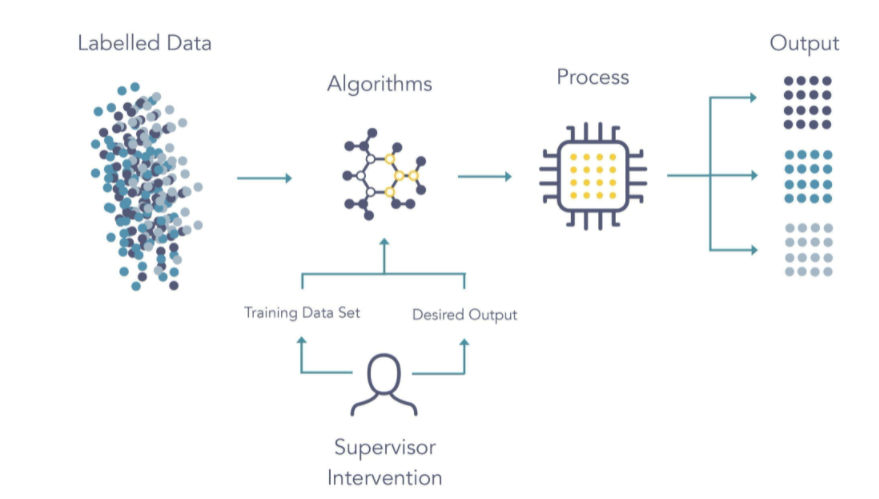

Under this context, sklearn classification algorithms will be used, namely:

* Logistic Regression Classification (Parametric)
* Decision Tree Classification (Non parametric)
* Random Forest Classification (Non parametric)
* K-Nearest Neighbour (KNN) Classification (Non parametric)

#  9.1 Logistic Regression Model

Logistic regression is a commonly used technique for solving binary classification problems. In a logistic regression model: 

- we take linear combination (or weighted sum of the input features) 
- we apply the sigmoid function to the result to obtain a number between 0 and 1
- this number represents the probability of the input being classified as "Yes"
- instead of RMSE, the cross entropy loss function is used to evaluate the results


Here's a visual summary of how a logistic regression model is structured





<img src="https://i.imgur.com/YMaMo5D.png" width="480">

The sigmoid function applied to the linear combination of inputs has the following formula:

<img src="https://i.imgur.com/sAVwvZP.png" width="400">

## 9.1.1 Train the Model

To train a logistic regression model, we can use the `LogisticRegression` class from Scikit-learn.

In [155]:
from sklearn.linear_model import LogisticRegression

Instantiate the model

In [156]:
model =  LogisticRegression(solver='liblinear', random_state=0)

We can train the model using `model.fit`.

In [157]:
model.fit(X_train, y_train)

LogisticRegression(random_state=0, solver='liblinear')

## 9.1.2  Making Predictions 



In [158]:
y_pred_test = model.predict(X_test)

`predict_proba method`

predict_proba method gives the probabilities for the target variable(0 and 1) in this case, in array form.

0 is for probability of no rain and 1 is for probability of rain.


#### Probability of getting output as 0 - no rain

In [159]:
model.predict_proba(X_test)[:,0]


array([0.92191716, 0.84523102, 0.82909616, ..., 0.88097357, 0.64249498,
       0.87378026])

#### Probability of getting output as 1 - rain

In [160]:
model.predict_proba(X_test)[:,1]

array([0.07808284, 0.15476898, 0.17090384, ..., 0.11902643, 0.35750502,
       0.12621974])

The numbers above indicate the probabilities for the target classes "No" and "Yes".

In [161]:
model.classes_

array(['No', 'Yes'], dtype=object)

## 9.1.3 Check accuracy score 

We can test the accuracy of the model's predictions by computing the percentage of matching values in `y_test` and `y_pred_test`.

This can be done using the `accuracy_score` function from `sklearn.metrics`.

In [162]:
from sklearn.metrics import accuracy_score

In [163]:
score_logreg = model.score(X_test, y_test)
score_logreg1 = model.score(X_train, y_train)

In [164]:
print('Training set score: {:.4f}'.format(model.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(model.score(X_test, y_test)))

Training set score: 0.8494
Test set score: 0.8418


Here, y_test are the true class labels and y_pred_test are the predicted class labels in the test-set.

## 9.1.4 Confusion matrix 

A _confusion matrix_ is a tool for summarizing the performance of a classification algorithm. A confusion matrix will give us a clear picture of classification model performance and the types of errors produced by the model. It gives us a summary of correct and incorrect predictions broken down by each category. The summary is represented in a tabular form.

In [165]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred_test)

print('Confusion matrix\n\n', cm)

print('\nTrue Positives(TP) = ', cm[0,0])

print('\nTrue Negatives(TN) = ', cm[1,1])

print('\nFalse Positives(FP) = ', cm[0,1])

print('\nFalse Negatives(FN) = ', cm[1,0])

Confusion matrix

 [[20654  1159]
 [ 3296  3049]]

True Positives(TP) =  20654

True Negatives(TN) =  3049

False Positives(FP) =  1159

False Negatives(FN) =  3296


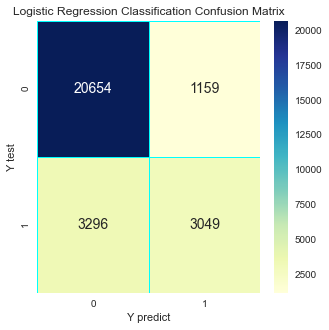

In [166]:
# The confusion matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns

logreg_cm = confusion_matrix(y_test, y_pred_test)
f, ax = plt.subplots(figsize=(5,5))
sns.heatmap(logreg_cm, annot=True, linewidth=0.7, linecolor='cyan', fmt='g', ax=ax, cmap="YlGnBu")
plt.title('Logistic Regression Classification Confusion Matrix')
plt.xlabel('Y predict')
plt.ylabel('Y test')
plt.show()

# 9.2 Decision tree classification Model

A decision tree is a flowchart-like tree structure where an internal node represents feature, the branch represents a decision rule, and each leaf node represents the outcome.

The basic idea behind any decision tree algorithm is as follows:

1. Select the best Feature using Attribute Selection Measures(ASM) to split the records.

2. Make that attribute/feature a decision node and break the dataset into smaller subsets.

3. Start the tree-building process by repeating this process recursively for each child until one of the following condition is being achieved :

    * All tuples belonging to the same attribute value.
    *  There are no more of the attributes remaining.
    *  There are no more instances remaining.
    
    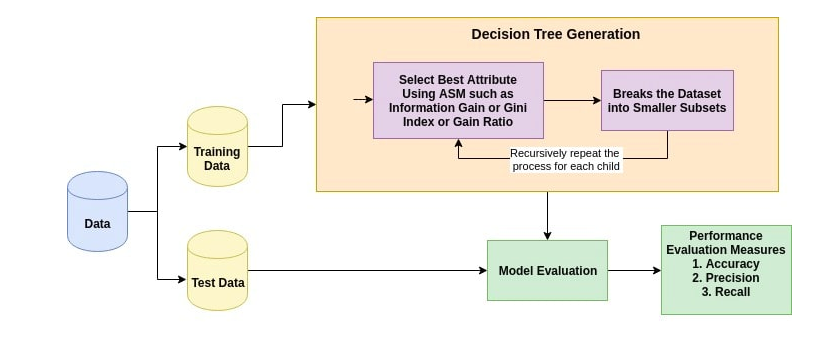
    
## 9.2.1 Train the Model

To train a  Decision tree model, we can use the DecisionTreeClassifier class from Scikit-learn.

In [167]:
from sklearn.tree import DecisionTreeClassifier

Instantiate the model

In [168]:
dtcla = DecisionTreeClassifier(random_state=9)

We can train the model using dtcla.fit.

In [169]:
dtcla.fit(X_train, y_train)

DecisionTreeClassifier(random_state=9)

## 9.2.2  Making Predictions

In [170]:
Y_predict2 = dtcla.predict(X_test)

## 9.2.3 Check accuracy score 

In [171]:
score_dtcla = dtcla.score(X_test, y_test)
score_dtcla1 = dtcla.score(X_train, y_train)

In [172]:
print('Training set score: {:.4f}'.format(dtcla.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(dtcla.score(X_test, y_test)))

Training set score: 1.0000
Test set score: 0.7902


## 9.2.4 Confusion matrix 

In [173]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, Y_predict2)

print('Confusion matrix\n\n', cm)

print('\nTrue Positives(TP) = ', cm[0,0])

print('\nTrue Negatives(TN) = ', cm[1,1])

print('\nFalse Positives(FP) = ', cm[0,1])

print('\nFalse Negatives(FN) = ', cm[1,0])

Confusion matrix

 [[18882  2931]
 [ 2977  3368]]

True Positives(TP) =  18882

True Negatives(TN) =  3368

False Positives(FP) =  2931

False Negatives(FN) =  2977


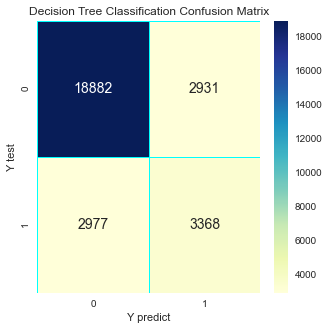

In [174]:
dtcla_cm = confusion_matrix(y_test, Y_predict2)
f, ax = plt.subplots(figsize=(5,5))
sns.heatmap(dtcla_cm, annot=True, linewidth=0.7, linecolor='cyan', fmt='g', ax=ax, cmap="YlGnBu")
plt.title('Decision Tree Classification Confusion Matrix')
plt.xlabel('Y predict')
plt.ylabel('Y test')
plt.show()

# 9.3 Random forest classification Model

Based on the previous classification method, random forest is a supervised learning algorithm that creates a forest randomly. This forest, is a set of decision trees, most of the times trained with the bagging method. The essential idea of bagging is to average many noisy but approximately impartial models, and therefore reduce the variation. Each tree is constructed using the following algorithm:

* Let  N  be the number of test cases,  M  is the number of variables in the classifier.
* Let  m  be the number of input variables to be used to determine the decision in a given node;  m<M .
* Choose a training set for this tree and use the rest of the test cases to estimate the error.
* For each node of the tree, randomly choose  m  variables on which to base the decision. Calculate the best partition of the training set from the  m  variables.
                                                                                                      
For prediction a new case is pushed down the tree. Then it is assigned the label of the terminal node where it ends. This process is iterated by all the trees in the assembly, and the label that gets the most incidents is reported as the prediction. We define the number of trees in the forest in 100.

## 9.3.1 Train the Model

To train a Random forest  model, we can use the RandomForestClassifier class from Scikit-learn.

In [175]:
from sklearn.ensemble import RandomForestClassifier

Instantiate the model

In [176]:
rfcla = RandomForestClassifier(n_estimators=100,random_state=9,n_jobs=-1)

We can train the model using rfcla.fit

In [177]:
rfcla.fit(X_train, y_train)

RandomForestClassifier(n_jobs=-1, random_state=9)

## 9.3.2  Making Predictions

In [178]:
Y_predict3 = rfcla.predict(X_test)

## 9.3.3 Check accuracy score

In [179]:
score_rfcla = rfcla.score(X_test, y_test)
score_rfcla1 = rfcla.score(X_train, y_train)

In [180]:
print('Training set score: {:.4f}'.format(rfcla.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(rfcla.score(X_test, y_test)))

Training set score: 1.0000
Test set score: 0.8513


## 9.3.4 Confusion matrix

In [181]:
cm = confusion_matrix(y_test, Y_predict3)

print('Confusion matrix\n\n', cm)

print('\nTrue Positives(TP) = ', cm[0,0])

print('\nTrue Negatives(TN) = ', cm[1,1])

print('\nFalse Positives(FP) = ', cm[0,1])

print('\nFalse Negatives(FN) = ', cm[1,0])

Confusion matrix

 [[20941   872]
 [ 3314  3031]]

True Positives(TP) =  20941

True Negatives(TN) =  3031

False Positives(FP) =  872

False Negatives(FN) =  3314


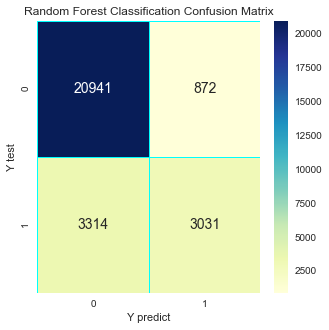

In [182]:
rfcla_cm = confusion_matrix(y_test, Y_predict3)
f, ax = plt.subplots(figsize=(5,5))
sns.heatmap(rfcla_cm, annot=True, linewidth=0.7, linecolor='cyan', fmt='g', ax=ax, cmap="YlGnBu")
plt.title('Random Forest Classification Confusion Matrix')
plt.xlabel('Y predict')
plt.ylabel('Y test')
plt.show()

# 9.4 K-Nearest Neighbor classification Model


K-Nearest neighbors is a technique that stores all available cases and classifies new cases based on a similarity measure (e.g., distance functions). This technique is non-parametric since there are no assumptions for the distribution of underlying data and it is lazy since it does not need any training data point model generation. All the training data used in the test phase. This makes the training faster and the test phase slower and more costlier. In this technique, the number of neighbors k is usually an odd number if the number of classes is 2. For finding closest similar points, we find the distance between points using distance measures such as Euclidean distance, Hamming distance, Manhattan distance and Minkowski distance.

For our case, we chose a number of neighbors equal to 15 because it throws the best test score within several selected ((K = 5 - TS = 0.816), (K = 15 - TS = 0.817), (K = 25 - TS = 0.813), (K = 35 - TS = 0.812), (K = 50 - TS = 0.809)).

## 9.4.1 Train the Model

To train a Random forest model, we can use the RandomForestClassifier class from Scikit-learn.

In [183]:
from sklearn.neighbors import KNeighborsClassifier

Instantiate the model

In [184]:
knncla = KNeighborsClassifier(n_neighbors=15,n_jobs=-1)

We can train the model using rfcla.fit

In [185]:
knncla.fit(X_train, y_train)

KNeighborsClassifier(n_jobs=-1, n_neighbors=15)

## 9.4.2 Making Predictions

In [186]:
Y_predict4 = knncla.predict(X_test)

## 9.4.3 Check accuracy score

In [187]:
score_knncla= knncla.score(X_test, y_test)
score_knncla1= knncla.score(X_train, y_train)

In [188]:
print('Training set score: {:.4f}'.format(knncla.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(knncla.score(X_test, y_test)))

Training set score: 0.8308
Test set score: 0.8056


## 9.4.4 Confusion matrix

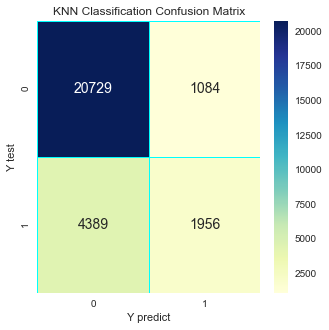

In [189]:
knncla_cm = confusion_matrix(y_test, Y_predict4)
f, ax = plt.subplots(figsize=(5,5))
sns.heatmap(knncla_cm, annot=True, linewidth=0.7, linecolor='cyan', fmt='g', ax=ax, cmap="YlGnBu")
plt.title('KNN Classification Confusion Matrix')
plt.xlabel('Y predict')
plt.ylabel('Y test')
plt.show()

In [190]:
Testscores = pd.Series([score_logreg, score_dtcla, score_rfcla, score_knncla], 
                        index=['Logistic Regression Test Score', 'Decision Tree Test Score', 'Random Forest Test Score', 
                               'K-Nearest Neighbour Test Score']) 
print(Testscores)

Logistic Regression Test Score    0.841786
Decision Tree Test Score          0.790184
Random Forest Test Score          0.851339
K-Nearest Neighbour Test Score    0.805633
dtype: float64


In [191]:
Trainscores = pd.Series([score_logreg1, score_dtcla1, score_rfcla1, score_knncla1], 
                        index=['Logistic Regression Train Score', 'Decision Tree Train Score', 'Random Forest Train Score', 
                               'K-Nearest Neighbour Train Score']) 
print(Trainscores)

Logistic Regression Train Score    0.849382
Decision Tree Train Score          1.000000
Random Forest Train Score          0.999991
K-Nearest Neighbour Train Score    0.830843
dtype: float64


# Evaluating Classification Model

## 10.1 Compare Model accuracy with null accuracy 

We cannot say that our model is very good based on the above accuracy. We must compare it with the null accuracy. 

`Null accuracy` is the accuracy that could be achieved by always predicting the most frequent class.

So, we should first check the class distribution in the test set.

### 10.1.1 Check class distribution in test set

In [192]:
y_test.value_counts()

No     21813
Yes     6345
Name: RainTomorrow, dtype: int64

We can see that the occurences of most frequent class is 21813. So, we can calculate null accuracy by dividing 21813 by total number of occurences.

### 10.1.2 Check null accuracy score

In [193]:
null_accuracy = (17650/(17650+4935))

print('Null accuracy score: {0:0.4f}'. format(null_accuracy))

Null accuracy score: 0.7815


##### Model accuracy score :

* Logistic Regression Test Score    0.841786
* Decision Tree Test Score          0.790184
* Random Forest Test Score          0.851339
* K-Nearest Neighbour Test Score    0.805633

* `Null accuracy score: 0.7815`

So, we can conclude that except Decision tree all three models are doing a good job in predicting the class labels.



# 10.2 ROC - AUC

#### ROC Curve

Another tool to measure the `classification model performance` visually is ROC Curve. ROC Curve stands for `Receiver Operating Characteristic Curve`. An ROC Curve is a plot which shows the performance of a classification model at various classification threshold levels.

The ROC Curve plots the `True Positive Rate` (TPR) against the `False Positive Rate (FPR)` at various threshold levels.

True Positive Rate (TPR) is also called Recall. It is defined as the ratio of TP to (TP + FN).

False Positive Rate (FPR) is defined as the ratio of FP to (FP + TN).

In the ROC Curve, we will focus on the TPR (True Positive Rate) and FPR (False Positive Rate) of a single point. This will give us the general performance of the ROC curve which consists of the TPR and FPR at various threshold levels. So, an ROC Curve plots TPR vs FPR at different classification threshold levels. If we lower the threshold levels, it may result in more items being classified as positve. It will increase both True Positives (TP) and False Positives (FP).

The higher the AUC, the better the performance of the model at distinguishing between the positive and negative classes.

In [194]:
from sklearn.metrics import roc_curve

### 10.2.1  Logistic Regression

Text(0.5, 1.0, 'ROC Curve Logistic Regression')

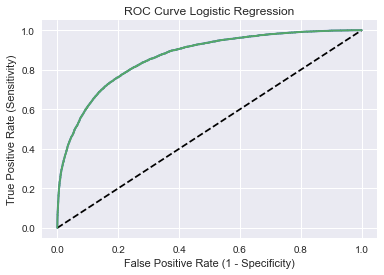

In [195]:
y_pred1 = model.predict_proba(X_test)
y_pred1 = model.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred1, pos_label = 'Yes')
plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, linewidth=2)
plt.plot([0,1], [0,1], 'k--' )
plt.rcParams['font.size'] = 12
plt.plot(fpr,tpr, label='ANN')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.title('ROC Curve Logistic Regression')


#### Compute ROC AUC

In [196]:
from sklearn.metrics import roc_auc_score

ROC_AUC = roc_auc_score(y_test, y_pred1)

print('ROC AUC For LR : {:.4f}'.format(ROC_AUC))

ROC AUC For LR : 0.8658


### 10.2.2 Decision Tree

Text(0.5, 1.0, 'ROC Curve Decision Tree')

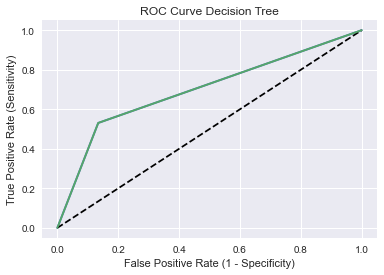

In [197]:
Y_predict4_proba = dtcla.predict_proba(X_test)
Y_predict4_proba = Y_predict4_proba[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, Y_predict4_proba , pos_label = 'Yes')
plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, linewidth=2)
plt.plot([0,1], [0,1], 'k--' )
plt.rcParams['font.size'] = 12
plt.plot(fpr,tpr, label='ANN')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.title('ROC Curve Decision Tree')


#### Compute ROC AUC

In [198]:
ROC_AUC = roc_auc_score(y_test, Y_predict4_proba)

print('ROC AUC For DT : {:.4f}'.format(ROC_AUC))

ROC AUC For DT : 0.6982


### 10.2.3 Random Forest 

Text(0.5, 1.0, 'ROC Curve Random Forest')

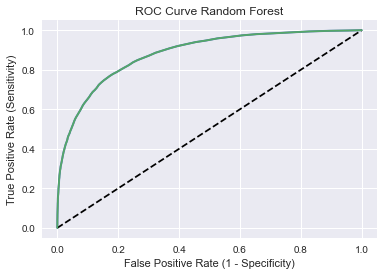

In [199]:
Y_predict5_proba = rfcla.predict_proba(X_test)
Y_predict5_proba = Y_predict5_proba[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, Y_predict5_proba,pos_label = 'Yes')
plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, linewidth=2)
plt.plot([0,1], [0,1], 'k--' )
plt.rcParams['font.size'] = 12
plt.plot(fpr,tpr, label='ANN')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.title('ROC Curve Random Forest')


#### Compute ROC AUC

In [200]:
ROC_AUC = roc_auc_score( y_test, Y_predict5_proba)

print('ROC AUC For RF : {:.4f}'.format(ROC_AUC))

ROC AUC For RF : 0.8817


### 10.2.4 KNN Classification

Text(0, 0.5, 'True Positive Rate (Sensitivity)')

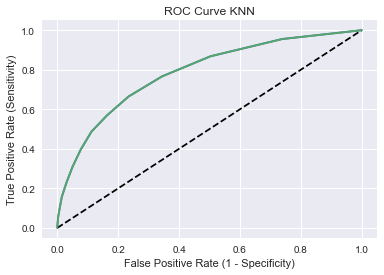

In [201]:
Y_predict6_proba = knncla.predict_proba(X_test)
Y_predict6_proba = Y_predict6_proba[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, Y_predict6_proba,pos_label = 'Yes')
plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, linewidth=2)
plt.plot([0,1], [0,1], 'k--' )
plt.rcParams['font.size'] = 12
plt.plot(fpr,tpr, label='ANN')
plt.title('ROC Curve KNN')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')

#### Compute ROC AUC

In [202]:
ROC_AUC = roc_auc_score( y_test, Y_predict6_proba)

print('ROC AUC For KNN : {:.4f}'.format(ROC_AUC))

ROC AUC For KNN : 0.7843


ROC AUC is a single number summary of classifier performance. The higher the value, the better the classifier.

ROC AUC of our models approaches towards 1. So, we can conclude that our classifiers does a good job in predicting whether it will rain tomorrow or not.

# 10.3 Classification Metrices 

`Classification report` is another way to evaluate the classification model performance. It displays the precision, recall, f1 and support scores for the model. I have described these terms in later.

We can print a classification report as follows:-

In [203]:
from sklearn.metrics import classification_report

## 10.3.1 Logistic Regression 

In [204]:
print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

          No       0.86      0.95      0.90     21813
         Yes       0.72      0.48      0.58      6345

    accuracy                           0.84     28158
   macro avg       0.79      0.71      0.74     28158
weighted avg       0.83      0.84      0.83     28158



In [205]:
TP =  20654
TN =  3049
FP =  1159
FN =  3296



In [206]:
# print classification accuracy

classification_accuracy = (TP + TN) / float(TP + TN + FP + FN)

print('Classification accuracy : {0:0.4f}'.format(classification_accuracy))

Classification accuracy : 0.8418


In [207]:
# print classification error

classification_error = (FP + FN) / float(TP + TN + FP + FN)

print('Classification error : {0:0.4f}'.format(classification_error))
          

Classification error : 0.1582


In [208]:
# print precision score

precision = TP / float(TP + FP)


print('Precision : {0:0.4f}'.format(precision))

Precision : 0.9469


In [209]:
# print Recall or Sensitivity

recall = TP / float(TP + FN)

print('Recall or Sensitivity : {0:0.4f}'.format(recall))

Recall or Sensitivity : 0.8624


In [210]:
# print True Positive Rate      
true_positive_rate = TP / float(TP + FN)
print('True Positive Rate : {0:0.4f}'.format(true_positive_rate))

True Positive Rate : 0.8624


In [211]:
# print False Positive Rate      
false_positive_rate = FP / float(FP + TN)
print('False Positive Rate : {0:0.4f}'.format(false_positive_rate))

False Positive Rate : 0.2754


In [212]:
# print Specificity
specificity = TN / (TN + FP)
print('Specificity : {0:0.4f}'.format(specificity))

Specificity : 0.7246


## 10.3.2 Decision Tree 

In [213]:
print(classification_report(y_test, Y_predict2))

              precision    recall  f1-score   support

          No       0.86      0.87      0.86     21813
         Yes       0.53      0.53      0.53      6345

    accuracy                           0.79     28158
   macro avg       0.70      0.70      0.70     28158
weighted avg       0.79      0.79      0.79     28158



In [214]:
TP = 18882
TN = 3368
FP =  2931
FN =  2977

In [215]:
# print classification accuracy

classification_accuracy = (TP + TN) / float(TP + TN + FP + FN)

print('Classification accuracy : {0:0.4f}'.format(classification_accuracy))

Classification accuracy : 0.7902


In [216]:
# print classification error

classification_error = (FP + FN) / float(TP + TN + FP + FN)

print('Classification error : {0:0.4f}'.format(classification_error))
          

Classification error : 0.2098


In [218]:
# print precision score
precision = TP / float(TP + FP)
print('Precision : {0:0.4f}'.format(precision))

Precision : 0.8656


In [219]:
# print Recall or Sensitivity
recall = TP / float(TP + FN)
print('Recall or Sensitivity : {0:0.4f}'.format(recall))

Recall or Sensitivity : 0.8638


In [220]:
# print True Positive Rate      
true_positive_rate = TP / float(TP + FN)
print('True Positive Rate : {0:0.4f}'.format(true_positive_rate))

True Positive Rate : 0.8638


In [221]:
# print False Positive Rate      
false_positive_rate = FP / float(FP + TN)
print('False Positive Rate : {0:0.4f}'.format(false_positive_rate))

False Positive Rate : 0.4653


In [222]:
# print Specificity
specificity = TN / (TN + FP)
print('Specificity : {0:0.4f}'.format(specificity))

Specificity : 0.5347


## 10.3.2 Random Forest Classification

In [223]:
print(classification_report(y_test, Y_predict3))

              precision    recall  f1-score   support

          No       0.86      0.96      0.91     21813
         Yes       0.78      0.48      0.59      6345

    accuracy                           0.85     28158
   macro avg       0.82      0.72      0.75     28158
weighted avg       0.84      0.85      0.84     28158



In [224]:
TP =  20941
TN =  3031
FP =  872
FN =  3314

In [225]:
# print classification accuracy

classification_accuracy = (TP + TN) / float(TP + TN + FP + FN)

print('Classification accuracy : {0:0.4f}'.format(classification_accuracy))

Classification accuracy : 0.8513


In [226]:
# print classification error

classification_error = (FP + FN) / float(TP + TN + FP + FN)

print('Classification error : {0:0.4f}'.format(classification_error))
          

Classification error : 0.1487


In [227]:
# print precision score

precision = TP / float(TP + FP)


print('Precision : {0:0.4f}'.format(precision))

Precision : 0.9600


In [228]:
# print Recall or Sensitivity

recall = TP / float(TP + FN)

print('Recall or Sensitivity : {0:0.4f}'.format(recall))

Recall or Sensitivity : 0.8634


In [229]:
# print True Positive Rate      
true_positive_rate = TP / float(TP + FN)
print('True Positive Rate : {0:0.4f}'.format(true_positive_rate))

True Positive Rate : 0.8634


In [230]:
# print False Positive Rate      
false_positive_rate = FP / float(FP + TN)
print('False Positive Rate : {0:0.4f}'.format(false_positive_rate))

False Positive Rate : 0.2234


In [231]:
# print Specificity
specificity = TN / (TN + FP)
print('Specificity : {0:0.4f}'.format(specificity))

Specificity : 0.7766


## 10.3.4 K-Nearest Neighbour (KNN) Classification 

In [232]:
print(classification_report(y_test, Y_predict4))

              precision    recall  f1-score   support

          No       0.83      0.95      0.88     21813
         Yes       0.64      0.31      0.42      6345

    accuracy                           0.81     28158
   macro avg       0.73      0.63      0.65     28158
weighted avg       0.78      0.81      0.78     28158



In [233]:
TP =  20729
TN =  1956
FP =  1084
FN =  4389

In [234]:
# print classification accuracy

classification_accuracy = (TP + TN) / float(TP + TN + FP + FN)

print('Classification accuracy : {0:0.4f}'.format(classification_accuracy))

Classification accuracy : 0.8056


In [235]:
# print classification error

classification_error = (FP + FN) / float(TP + TN + FP + FN)

print('Classification error : {0:0.4f}'.format(classification_error))
          

Classification error : 0.1944


In [236]:
# print precision score

precision = TP / float(TP + FP)


print('Precision : {0:0.4f}'.format(precision))

Precision : 0.9503


In [237]:
# print Recall or Sensitivity

recall = TP / float(TP + FN)

print('Recall or Sensitivity : {0:0.4f}'.format(recall))

Recall or Sensitivity : 0.8253


In [238]:
# print True Positive Rate      
true_positive_rate = TP / float(TP + FN)
print('True Positive Rate : {0:0.4f}'.format(true_positive_rate))

True Positive Rate : 0.8253


In [239]:
# print False Positive Rate      
false_positive_rate = FP / float(FP + TN)
print('False Positive Rate : {0:0.4f}'.format(false_positive_rate))

False Positive Rate : 0.3566


In [240]:
# print Specificity
specificity = TN / (TN + FP)
print('Specificity : {0:0.4f}'.format(specificity))

Specificity : 0.6434


# 10.4 Confusion Matrix

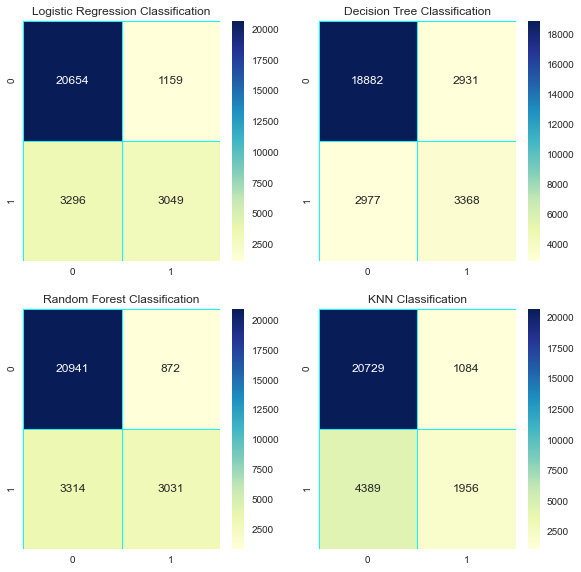

In [241]:
fig = plt.figure(figsize=(15,15))
ax1 = fig.add_subplot(3, 3, 1) 
ax1.set_title('Logistic Regression Classification') 
ax4 = fig.add_subplot(3, 3, 2)
ax4.set_title('Decision Tree Classification')
ax5 = fig.add_subplot(3, 3, 4)
ax5.set_title('Random Forest Classification')
ax6 = fig.add_subplot(3, 3, 5)
ax6.set_title('KNN Classification')
sns.heatmap(data=logreg_cm, annot=True, linewidth=0.7, linecolor='cyan',cmap="YlGnBu" ,fmt='g', ax=ax1)
sns.heatmap(data=dtcla_cm, annot=True, linewidth=0.7, linecolor='cyan',cmap="YlGnBu" ,fmt='g', ax=ax4)
sns.heatmap(data=rfcla_cm, annot=True, linewidth=0.7, linecolor='cyan',cmap="YlGnBu" ,fmt='g', ax=ax5)
sns.heatmap(data=knncla_cm, annot=True, linewidth=0.7, linecolor='cyan',cmap="YlGnBu" ,fmt='g', ax=ax6)
plt.show()

# 11. Adjusting the threshold level

##  11.1 Logistic Regression 

### 11.1.1 Print the first 10 predicted probabilities of two classes- 0 and 1

In [242]:
y_pred_prob = model.predict_proba(X_test)[0:10]

y_pred_prob

array([[0.92191716, 0.07808284],
       [0.84523102, 0.15476898],
       [0.82909616, 0.17090384],
       [0.96396544, 0.03603456],
       [0.98223786, 0.01776214],
       [0.69405649, 0.30594351],
       [0.91058384, 0.08941616],
       [0.88368134, 0.11631866],
       [0.35743678, 0.64256322],
       [0.21437646, 0.78562354]])

#### Observations

* In each row, the numbers sum to 1.


* There are 2 columns which correspond to 2 classes - 0 and 1.


     Class 0 - predicted probability that there is no rain tomorrow.   
     Class 1 - predicted probability that there is rain tomorrow.
     

* Importance of predicted probabilities

   * We can rank the observations by probability of rain or no rain.

* Predict_proba process

   * Predicts the probabilities 
   * Choose the class with the highest probability

* Classification threshold level

    * There is a classification threshold level of 0.5.
    * Class 1 - probability of rain is predicted if probability > 0.5.
    * Class 0 - probability of no rain is predicted if probability < 0.5.

### 11.1.2 Store the probabilities in dataframe


In [243]:
y_pred_prob_df = pd.DataFrame(data=y_pred_prob, columns=['Prob of - No rain tomorrow (0)', 'Prob of - Rain tomorrow (1)'])

y_pred_prob_df

,Prob of - No rain tomorrow (0),Prob of - Rain tomorrow (1)
0,0.921917,0.078083
1,0.845231,0.154769
2,0.829096,0.170904
3,0.963965,0.036035
4,0.982238,0.017762
5,0.694056,0.305944
6,0.910584,0.089416
7,0.883681,0.116319
8,0.357437,0.642563
9,0.214376,0.785624


#### Print the first 10 predicted probabilities for class 1 - Probability of rain

In [244]:
model.predict_proba(X_test)[0:10, 1]

array([0.07808284, 0.15476898, 0.17090384, 0.03603456, 0.01776214,
       0.30594351, 0.08941616, 0.11631866, 0.64256322, 0.78562354])

#### Store the predicted probabilities for class 1 - Probability of rain

In [245]:
y_pred1 = model.predict_proba(X_test)[:, 1]

### 11.1.3 Plot histogram of predicted probabilities


Text(0, 0.5, 'Frequency')

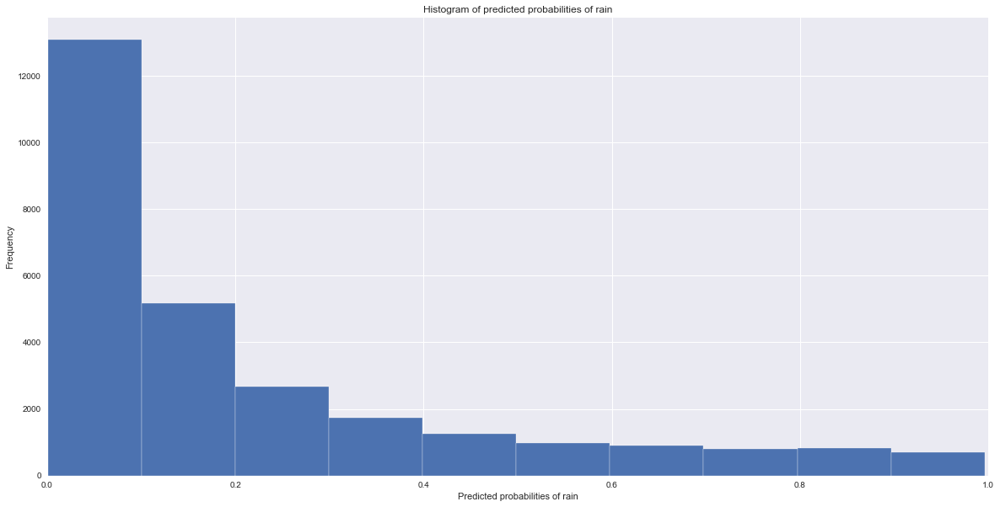

In [246]:
plt.hist(y_pred1, bins = 10)
plt.title('Histogram of predicted probabilities of rain')
plt.xlim(0,1)

plt.xlabel('Predicted probabilities of rain')
plt.ylabel('Frequency')

#### Observations

* We can see that the above histogram is `highly positive skewed.`

* The first column tell us that there are approximately 13000 observations with probability between 0.0 and 0.1.

* There are small number of observations with probability > 0.5.

* So, these small number of observations predict that there will be rain tomorrow.

* Majority of observations predict that there will be no rain tomorrow.

##  11.2 Decision Tree 

### 11.2.1 Print the first 10 predicted probabilities of two classes- 0 and 1

In [247]:
y_pred_prob1 = dtcla.predict_proba(X_test)[0:10]

y_pred_prob1

array([[1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [0., 1.]])

### 11.2.2 Store the probabilities in dataframe

In [248]:
y_pred_prob_df1 = pd.DataFrame(data=y_pred_prob1, columns=['Prob of - No rain tomorrow (0)', 'Prob of - Rain tomorrow (1)'])

y_pred_prob_df1

,Prob of - No rain tomorrow (0),Prob of - Rain tomorrow (1)
0,1.0,0.0
1,1.0,0.0
2,1.0,0.0
3,1.0,0.0
4,1.0,0.0
5,1.0,0.0
6,1.0,0.0
7,1.0,0.0
8,0.0,1.0
9,0.0,1.0


#### Print the first 10 predicted probabilities for class 1 - Probability of rain

In [249]:
dtcla.predict_proba(X_test)[0:10, 1]

array([0., 0., 0., 0., 0., 0., 0., 0., 1., 1.])

#### Store the predicted probabilities for class 1 - Probability of rain

In [250]:
y_pred1d = dtcla.predict_proba(X_test)[:, 1]

### 11.2.3 Plot histogram of predicted probabilities

Text(0, 0.5, 'Frequency')

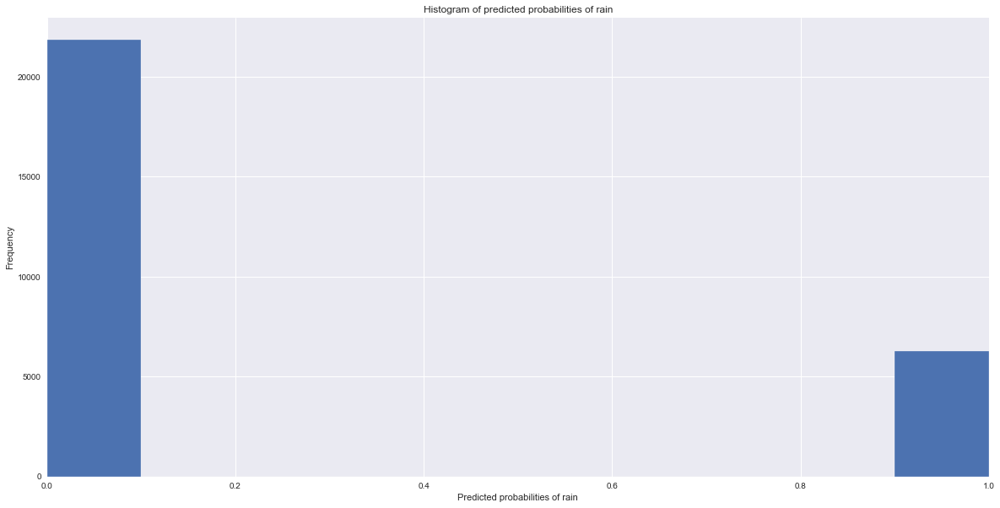

In [251]:
plt.hist(y_pred1d, bins = 10)
plt.title('Histogram of predicted probabilities of rain')
plt.xlim(0,1)

plt.xlabel('Predicted probabilities of rain')
plt.ylabel('Frequency')

Observation : So we cant predict on the basis of Decision Tree 

##  11.3 Random Forest

### 11.3.1 Print the first 10 predicted probabilities of two classes- 0 and 1

In [252]:
y_pred_prob2 = rfcla.predict_proba(X_test)[0:10]

y_pred_prob2

array([[0.88, 0.12],
       [0.87, 0.13],
       [0.76, 0.24],
       [0.91, 0.09],
       [0.94, 0.06],
       [0.71, 0.29],
       [0.94, 0.06],
       [0.85, 0.15],
       [0.48, 0.52],
       [0.27, 0.73]])

### 11.3.2 Store the probabilities in dataframe

In [253]:
y_pred_prob_df2 = pd.DataFrame(data=y_pred_prob2, columns=['Prob of - No rain tomorrow (0)', 'Prob of - Rain tomorrow (1)'])

y_pred_prob_df2

,Prob of - No rain tomorrow (0),Prob of - Rain tomorrow (1)
0,0.88,0.12
1,0.87,0.13
2,0.76,0.24
3,0.91,0.09
4,0.94,0.06
5,0.71,0.29
6,0.94,0.06
7,0.85,0.15
8,0.48,0.52
9,0.27,0.73


#### Print the first 10 predicted probabilities for class 1 - Probability of rain

In [254]:
rfcla.predict_proba(X_test)[0:10, 1]

array([0.12, 0.13, 0.24, 0.09, 0.06, 0.29, 0.06, 0.15, 0.52, 0.73])

#### Store the predicted probabilities for class 1 - Probability of rain

In [255]:
y_pred1r = rfcla.predict_proba(X_test)[:, 1]

### 11.3.3 Plot histogram of predicted probabilities

Text(0, 0.5, 'Frequency')

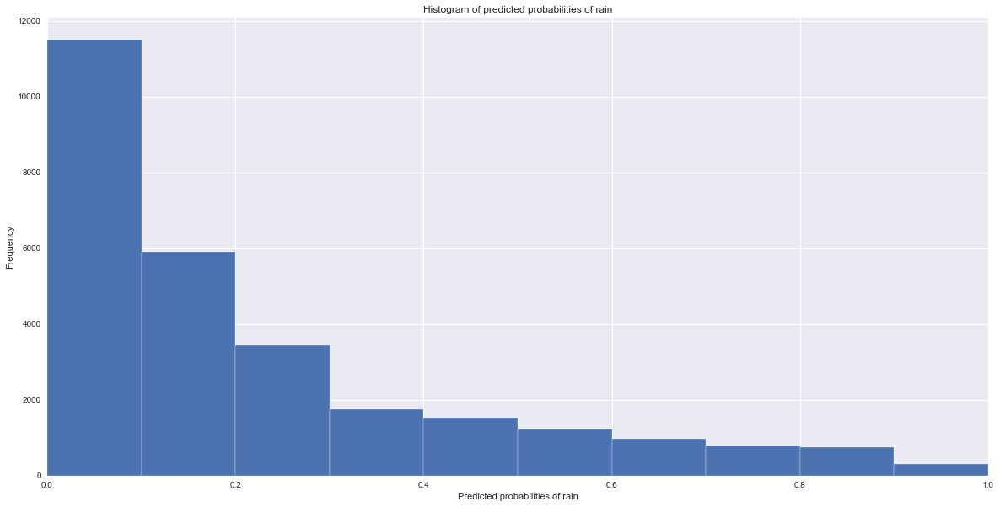

In [256]:
plt.hist(y_pred1r, bins = 10)
plt.title('Histogram of predicted probabilities of rain')
plt.xlim(0,1)

plt.xlabel('Predicted probabilities of rain')
plt.ylabel('Frequency')

#### Observations

* We can see that the above histogram is `highly positive skewed.`

* The first column tell us that there are approximately 13000 observations with probability between 0.0 and 0.1.

* There are small number of observations with probability > 0.5.

* So, these small number of observations predict that there will be rain tomorrow.

* Majority of observations predict that there will be no rain tomorrow.

##  11.4 KNN

### 11.4.1 Print the first 10 predicted probabilities of two classes- 0 and 1

In [257]:
y_pred_prob3 = knncla.predict_proba(X_test)[0:10]

y_pred_prob3

array([[0.86666667, 0.13333333],
       [0.86666667, 0.13333333],
       [0.86666667, 0.13333333],
       [0.93333333, 0.06666667],
       [1.        , 0.        ],
       [0.93333333, 0.06666667],
       [1.        , 0.        ],
       [1.        , 0.        ],
       [0.66666667, 0.33333333],
       [0.86666667, 0.13333333]])

### 11.4.1 Print the first 10 predicted probabilities of two classes- 0 and 1

In [297]:
y_pred_prob_df3 = pd.DataFrame(data=y_pred_prob3, columns=['Prob of - No rain tomorrow (0)', 'Prob of - Rain tomorrow (1)'])

y_pred_prob_df3

,Prob of - No rain tomorrow (0),Prob of - Rain tomorrow (1)
0,0.866667,0.133333
1,0.866667,0.133333
2,0.866667,0.133333
3,0.933333,0.066667
4,1.000000,0.000000
5,0.933333,0.066667
6,1.000000,0.000000
7,1.000000,0.000000
8,0.666667,0.333333
9,0.866667,0.133333


#### Print the first 10 predicted probabilities for class 1 - Probability of rain

In [258]:
knncla.predict_proba(X_test)[0:10, 1]

array([0.13333333, 0.13333333, 0.13333333, 0.06666667, 0.        ,
       0.06666667, 0.        , 0.        , 0.33333333, 0.13333333])

#### Store the predicted probabilities for class 1 - Probability of rain

In [259]:
y_pred1k = knncla.predict_proba(X_test)[:, 1]

### 11.4.3 Plot histogram of predicted probabilities


Text(0, 0.5, 'Frequency')

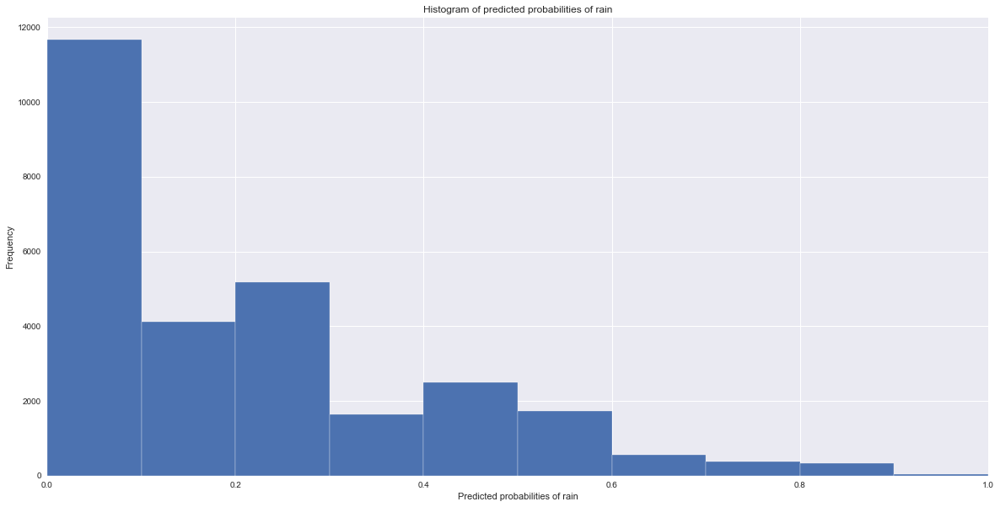

In [260]:
plt.hist(y_pred1k, bins = 10)
plt.title('Histogram of predicted probabilities of rain')
plt.xlim(0,1)

plt.xlabel('Predicted probabilities of rain')
plt.ylabel('Frequency')

#### Observations

* We can see that the above histogram is ` positive skewed.`

* The first column tell us that there are approximately 13000 observations with probability between 0.0 and 0.1.

* There are small number of observations with probability > 0.5.

* So, these small number of observations predict that there will be rain tomorrow.

* Majority of observations predict that there will be no rain tomorrow.

# 12 Lower the threshold

## 12.1 Logistic Regression

In [298]:
from sklearn.preprocessing import binarize

for i in range(1,5):
    
    cm1=0
    
    y_pred1 = model.predict_proba(X_test)[:,1]
    
    y_pred1 = y_pred1.reshape(-1,1)
    
    y_pred2 = binarize(y_pred1, i/10)
    
    y_pred2 = np.where(y_pred2 == 1, 'Yes', 'No')
    
    cm1 = confusion_matrix(y_test, y_pred2)
        
    print ('With',i/10,'threshold the Confusion Matrix is ','\n',cm1,'\n',
           
            'with',cm1[0,0]+cm1[1,1],'correct predictions, ', '\n', 
           
            cm1[0,1],'Type I errors( False Positives), ','\n',
           
            cm1[1,0],'Type II errors( False Negatives), ','\n',
           
           'Accuracy score: ', (accuracy_score(y_test, y_pred2)), '\n',
           
           'Sensitivity: ',cm1[1,1]/(float(cm1[1,1]+cm1[1,0])), '\n',
           
           'Specificity: ',cm1[0,0]/(float(cm1[0,0]+cm1[0,1])),'\n',
          
            '====================================================', '\n')

With 0.1 threshold the Confusion Matrix is  
 [[12517  9296]
 [  533  5812]] 
 with 18329 correct predictions,  
 9296 Type I errors( False Positives),  
 533 Type II errors( False Negatives),  
 Accuracy score:  0.6509340151999432 
 Sensitivity:  0.9159968479117415 
 Specificity:  0.573832118461468 

With 0.2 threshold the Confusion Matrix is  
 [[16909  4904]
 [ 1349  4996]] 
 with 21905 correct predictions,  
 4904 Type I errors( False Positives),  
 1349 Type II errors( False Negatives),  
 Accuracy score:  0.7779316712834718 
 Sensitivity:  0.7873916469661151 
 Specificity:  0.7751799385687435 

With 0.3 threshold the Confusion Matrix is  
 [[18915  2898]
 [ 2036  4309]] 
 with 23224 correct predictions,  
 2898 Type I errors( False Positives),  
 2036 Type II errors( False Negatives),  
 Accuracy score:  0.8247744868243483 
 Sensitivity:  0.679117415287628 
 Specificity:  0.86714344656856 

With 0.4 threshold the Confusion Matrix is  
 [[19994  1819]
 [ 2704  3641]] 
 with 23635 

#### Comments

* In binary problems, the threshold of 0.5 is used by default to convert predicted probabilities into class predictions.

* Threshold can be adjusted to increase sensitivity or specificity.

* Sensitivity and specificity have an inverse relationship. Increasing one would always decrease the other and vice versa.

* We can see that increasing the threshold level results in increased accuracy.

* Adjusting the threshold level should be one of the last step you do in the model-building process.


## 12.2 Decision Tree

In [299]:
from sklearn.preprocessing import binarize

for i in range(1,5):
    
    cm1=0
    
    y_pred1d = dtcla.predict_proba(X_test)[:,1]
    
    y_pred1d = y_pred1d.reshape(-1,1)
    
    y_pred2d = binarize(y_pred1d, i/10)
    
    y_pred2d = np.where(y_pred2d == 1, 'Yes', 'No')
    
    cm1 = confusion_matrix(y_test, y_pred2d)
        
    print ('With',i/10,'threshold the Confusion Matrix is ','\n',cm1,'\n',
           
            'with',cm1[0,0]+cm1[1,1],'correct predictions, ', '\n', 
           
            cm1[0,1],'Type I errors( False Positives), ','\n',
           
            cm1[1,0],'Type II errors( False Negatives), ','\n',
           
           'Accuracy score: ', (accuracy_score(y_test, y_pred2d)), '\n',
           
           'Sensitivity: ',cm1[1,1]/(float(cm1[1,1]+cm1[1,0])), '\n',
           
           'Specificity: ',cm1[0,0]/(float(cm1[0,0]+cm1[0,1])),'\n',
          
            '====================================================', '\n')

With 0.1 threshold the Confusion Matrix is  
 [[18882  2931]
 [ 2977  3368]] 
 with 22250 correct predictions,  
 2931 Type I errors( False Positives),  
 2977 Type II errors( False Negatives),  
 Accuracy score:  0.7901839619291143 
 Sensitivity:  0.5308116627265563 
 Specificity:  0.8656305872644753 

With 0.2 threshold the Confusion Matrix is  
 [[18882  2931]
 [ 2977  3368]] 
 with 22250 correct predictions,  
 2931 Type I errors( False Positives),  
 2977 Type II errors( False Negatives),  
 Accuracy score:  0.7901839619291143 
 Sensitivity:  0.5308116627265563 
 Specificity:  0.8656305872644753 

With 0.3 threshold the Confusion Matrix is  
 [[18882  2931]
 [ 2977  3368]] 
 with 22250 correct predictions,  
 2931 Type I errors( False Positives),  
 2977 Type II errors( False Negatives),  
 Accuracy score:  0.7901839619291143 
 Sensitivity:  0.5308116627265563 
 Specificity:  0.8656305872644753 

With 0.4 threshold the Confusion Matrix is  
 [[18882  2931]
 [ 2977  3368]] 
 with 2

We can see that increasing the threshold level don't increase in accuracy.

## 12.3 Random Forest Classification 

In [300]:
from sklearn.preprocessing import binarize

for i in range(1,5):
    
    cm1=0
    
    y_pred1r = rfcla.predict_proba(X_test)[:,1]
    
    y_pred1r = y_pred1r.reshape(-1,1)
    
    y_pred2r = binarize(y_pred1r, i/10)
    
    y_pred2r = np.where(y_pred2r == 1, 'Yes', 'No')
    
    cm1 = confusion_matrix(y_test, y_pred2r)
        
    print ('With',i/10,'threshold the Confusion Matrix is ','\n',cm1,'\n',
           
            'with',cm1[0,0]+cm1[1,1],'correct predictions, ', '\n', 
           
            cm1[0,1],'Type I errors( False Positives), ','\n',
           
            cm1[1,0],'Type II errors( False Negatives), ','\n',
           
           'Accuracy score: ', (accuracy_score(y_test, y_pred2r)), '\n',
           
           'Sensitivity: ',cm1[1,1]/(float(cm1[1,1]+cm1[1,0])), '\n',
           
           'Specificity: ',cm1[0,0]/(float(cm1[0,0]+cm1[0,1])),'\n',
          
            '====================================================', '\n')

With 0.1 threshold the Confusion Matrix is  
 [[11891  9922]
 [  381  5964]] 
 with 17855 correct predictions,  
 9922 Type I errors( False Positives),  
 381 Type II errors( False Negatives),  
 Accuracy score:  0.6341004332694083 
 Sensitivity:  0.939952718676123 
 Specificity:  0.5451336359051941 

With 0.2 threshold the Confusion Matrix is  
 [[16704  5109]
 [ 1125  5220]] 
 with 21924 correct predictions,  
 5109 Type I errors( False Positives),  
 1125 Type II errors( False Negatives),  
 Accuracy score:  0.7786064351161304 
 Sensitivity:  0.8226950354609929 
 Specificity:  0.7657818731948838 

With 0.3 threshold the Confusion Matrix is  
 [[18993  2820]
 [ 1851  4494]] 
 with 23487 correct predictions,  
 2820 Type I errors( False Positives),  
 1851 Type II errors( False Negatives),  
 Accuracy score:  0.8341146388237801 
 Sensitivity:  0.708274231678487 
 Specificity:  0.8707192958327603 

With 0.4 threshold the Confusion Matrix is  
 [[20185  1628]
 [ 2581  3764]] 
 with 2394

We can see that increasing the threshold level results in increased accuracy.

## 12.4 K-Nearest Neighbour (KNN)

In [301]:
from sklearn.preprocessing import binarize

for i in range(1,5):
    
    cm1=0
    
    y_pred1k = knncla.predict_proba(X_test)[:,1]
    
    y_pred1k = y_pred1.reshape(-1,1)
    
    y_pred2k = binarize(y_pred1k, i/10)
    
    y_pred2k = np.where(y_pred2k == 1, 'Yes', 'No')
    
    cm1 = confusion_matrix(y_test, y_pred2k)
        
    print ('With',i/10,'threshold the Confusion Matrix is ','\n',cm1,'\n',
           
            'with',cm1[0,0]+cm1[1,1],'correct predictions, ', '\n', 
           
            cm1[0,1],'Type I errors( False Positives), ','\n',
           
            cm1[1,0],'Type II errors( False Negatives), ','\n',
           
           'Accuracy score: ', (accuracy_score(y_test, y_pred2k)), '\n',
           
           'Sensitivity: ',cm1[1,1]/(float(cm1[1,1]+cm1[1,0])), '\n',
           
           'Specificity: ',cm1[0,0]/(float(cm1[0,0]+cm1[0,1])),'\n',
          
            '====================================================', '\n')

With 0.1 threshold the Confusion Matrix is  
 [[12517  9296]
 [  533  5812]] 
 with 18329 correct predictions,  
 9296 Type I errors( False Positives),  
 533 Type II errors( False Negatives),  
 Accuracy score:  0.6509340151999432 
 Sensitivity:  0.9159968479117415 
 Specificity:  0.573832118461468 

With 0.2 threshold the Confusion Matrix is  
 [[16909  4904]
 [ 1349  4996]] 
 with 21905 correct predictions,  
 4904 Type I errors( False Positives),  
 1349 Type II errors( False Negatives),  
 Accuracy score:  0.7779316712834718 
 Sensitivity:  0.7873916469661151 
 Specificity:  0.7751799385687435 

With 0.3 threshold the Confusion Matrix is  
 [[18915  2898]
 [ 2036  4309]] 
 with 23224 correct predictions,  
 2898 Type I errors( False Positives),  
 2036 Type II errors( False Negatives),  
 Accuracy score:  0.8247744868243483 
 Sensitivity:  0.679117415287628 
 Specificity:  0.86714344656856 

With 0.4 threshold the Confusion Matrix is  
 [[19994  1819]
 [ 2704  3641]] 
 with 23635 

We can see that increasing the threshold level results in increased accuracy.

# 13. Model improvement

In this section, I will employ several techniques to improve the model performance. I will discuss 2 techniques which are used in practice for performance improvement. These are `k-fold cross validation` and `hyperparameter optimization using GridSearchCV.`

## 13.1 k-Fold Cross Validation 

Cross-validation is primarily used in applied machine learning to estimate the skill of a machine learning model on unseen data. That is, to use a limited sample in order to estimate how the model is expected to perform in general when used to make predictions on data not used during the training of the model.

<img src="https://zitaoshen.rbind.io/project/machine_learning/machine-learning-101-cross-vaildation/featured.png" width="480">


In [265]:
from sklearn.model_selection import cross_val_score

### 13.1.1 Logistic Regression

##### Applying 5-Fold Cross Validation

In [302]:
scores_LR = cross_val_score(model, X_test, y_test, cv = 5, scoring='accuracy')

print(' LR Cross-validation scores:{}'.format(scores_LR))

 LR Cross-validation scores:[0.83504972 0.84286222 0.8462358  0.84354466 0.84318949]


We can summarize the cross-validation accuracy by calculating its `mean`.

##### Compute Average cross-validation score


In [267]:
print('Average cross-validation score: {:.4f}'.format(scores_LR.mean()))

Average cross-validation score: 0.8422


Our, original model score is found to be 0.8442. The average cross-validation score is 0.8439. So, we can conclude that cross-validation does not result in performance improvement.

### 13.1.2 Decision Tree

##### Applying 5-Fold Cross Validation

In [268]:
scores_DT = cross_val_score(dtcla, X_test, y_test, cv = 5, scoring='accuracy')

print('Cross-validation scores:{}'.format(scores_DT))

Cross-validation scores:[0.77716619 0.77627841 0.77734375 0.77712662 0.78884745]


##### Compute Average cross-validation score


In [269]:
print('Average cross-validation score: {:.4f}'.format(scores_DT.mean()))

Average cross-validation score: 0.7794


### 13.1.3 Random Forest

##### Applying 5-Fold Cross Validation

In [270]:
scores_RF = cross_val_score(rfcla, X_test, y_test, cv = 5, scoring='accuracy')

print('Cross-validation scores:{}'.format(scores_RF))

Cross-validation scores:[0.84179688 0.84570312 0.84570312 0.84638608 0.8414136 ]


##### Compute Average cross-validation score

In [271]:
print('Average cross-validation score: {:.4f}'.format(scores_RF.mean()))

Average cross-validation score: 0.8442


### 13.1.4 K-Nearest Neighbour (KNN)

##### Applying 5-Fold Cross Validation

In [272]:
scores_KNN = cross_val_score(knncla, X_test, y_test, cv = 5, scoring='accuracy')

print('Cross-validation scores:{}'.format(scores_RF))

Cross-validation scores:[0.84179688 0.84570312 0.84570312 0.84638608 0.8414136 ]


##### Compute Average cross-validation score

In [273]:
print('Average cross-validation score: {:.4f}'.format(scores_KNN.mean()))

Average cross-validation score: 0.8015


## 13.2 Hyperparameter Optimization using GridSearch CV 


  <img src="https://miro.medium.com/max/700/1*yHNmVkf43eTJF5QDebUltQ.png" width="480">

    
    

In [274]:
from sklearn.model_selection import GridSearchCV

### Logistic Regression 

In [275]:
parameters = [{'penalty':['l1','l2']}, 
              {'C':[1, 10, 100, 1000]}]

In [276]:
grid_search = GridSearchCV(estimator = model,param_grid = parameters,scoring = 'accuracy',cv = 5,verbose=0)

In [277]:
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=LogisticRegression(random_state=0, solver='liblinear'),
             param_grid=[{'penalty': ['l1', 'l2']}, {'C': [1, 10, 100, 1000]}],
             scoring='accuracy')

#### Examine the best model

##### Best score achieved during the GridSearchCV

In [278]:
print('GridSearch CV best score : {:.4f}\n\n'.format(grid_search.best_score_))

GridSearch CV best score : 0.8487




##### Print parameters that give the best results

In [279]:
print('Parameters that give the best results :','\n\n', (grid_search.best_params_))

Parameters that give the best results : 

 {'penalty': 'l2'}


##### Print estimator that was chosen by the GridSearch

In [280]:
print('\n\nEstimator that was chosen by the search :','\n\n', (grid_search.best_estimator_))



Estimator that was chosen by the search : 

 LogisticRegression(random_state=0, solver='liblinear')


##### Calculate GridSearch CV score on test set

In [281]:
print('GridSearch CV score on test set: {0:0.4f}'.format(grid_search.score(X_test, y_test)))

GridSearch CV score on test set: 0.8418


#### Comments

Our original model test accuracy is `0.8442` while GridSearch CV accuracy is `0.8446`.

We can see that GridSearch CV slightly improve the performance for this particular model.


### Random Forest 

In [282]:
param_grid = { 
    'n_estimators': [200,300],
    'max_features': [10,20,30]
}

In [283]:
cv = GridSearchCV(estimator=rfcla, param_grid=param_grid, scoring = 'accuracy',cv = 5,verbose=0)

In [284]:
cv.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(n_jobs=-1, random_state=9),
             param_grid={'max_features': [10, 20, 30],
                         'n_estimators': [200, 300]},
             scoring='accuracy')

#### Examine the best model

##### Best score achieved during the GridSearchCV

In [285]:
print('GridSearch CV best score : {:.4f}\n\n'.format(cv.best_score_))

GridSearch CV best score : 0.8570




##### Print parameters that give the best results

In [286]:
print('Parameters that give the best results :','\n\n', (cv.best_params_))

Parameters that give the best results : 

 {'max_features': 30, 'n_estimators': 300}


##### Print estimator that was chosen by the GridSearch

In [287]:
print('\n\nEstimator that was chosen by the search :','\n\n', (cv.best_estimator_))



Estimator that was chosen by the search : 

 RandomForestClassifier(max_features=30, n_estimators=300, n_jobs=-1,
                       random_state=9)


##### Calculate GridSearch CV score on test set

In [288]:
print('GridSearch CV score on test set: {0:0.4f}'.format(cv.score(X_test, y_test)))

GridSearch CV score on test set: 0.8534


 # 14 Comparison of classification techniques

### Test Scores



In [289]:
Testscores = pd.Series([score_logreg, score_dtcla, score_rfcla, score_knncla], 
                        index=['Logistic Regression Test Score', 'Decision Tree Test Score', 'Random Forest Test Score', 
                               'K-Nearest Neighbour Test Score']) 
print(Testscores)

Logistic Regression Test Score    0.841786
Decision Tree Test Score          0.790184
Random Forest Test Score          0.851339
K-Nearest Neighbour Test Score    0.805633
dtype: float64


### Train Score 

In [290]:
Trainscores = pd.Series([score_logreg1, score_dtcla1, score_rfcla1, score_knncla1], 
                        index=['Logistic Regression Train Score', 'Decision Tree Train Score', 'Random Forest Train Score', 
                               'K-Nearest Neighbour Train Score']) 
print(Trainscores)

Logistic Regression Train Score    0.849382
Decision Tree Train Score          1.000000
Random Forest Train Score          0.999991
K-Nearest Neighbour Train Score    0.830843
dtype: float64


### Null Accuracy

In [291]:
print('Null accuracy score: {0:0.4f}'. format(null_accuracy))

Null accuracy score: 0.7815


### Confusion Matrix

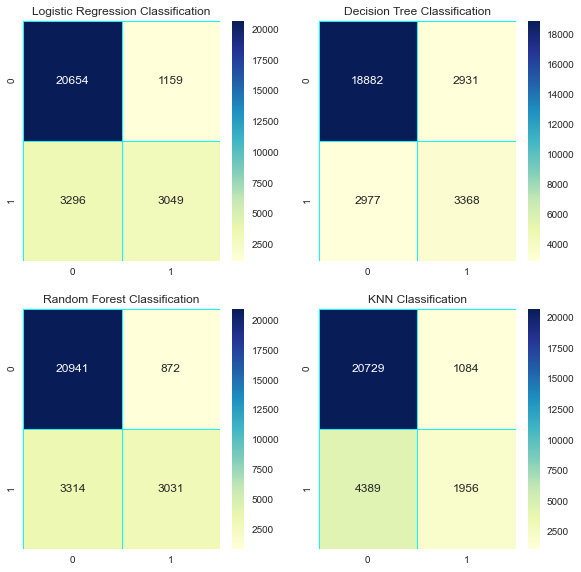

In [292]:
fig = plt.figure(figsize=(15,15))
ax1 = fig.add_subplot(3, 3, 1) 
ax1.set_title('Logistic Regression Classification') 
ax4 = fig.add_subplot(3, 3, 2)
ax4.set_title('Decision Tree Classification')
ax5 = fig.add_subplot(3, 3, 4)
ax5.set_title('Random Forest Classification')
ax6 = fig.add_subplot(3, 3, 5)
ax6.set_title('KNN Classification')
sns.heatmap(data=logreg_cm, annot=True, linewidth=0.7, linecolor='cyan',cmap="YlGnBu" ,fmt='g', ax=ax1)
sns.heatmap(data=dtcla_cm, annot=True, linewidth=0.7, linecolor='cyan',cmap="YlGnBu" ,fmt='g', ax=ax4)
sns.heatmap(data=rfcla_cm, annot=True, linewidth=0.7, linecolor='cyan',cmap="YlGnBu" ,fmt='g', ax=ax5)
sns.heatmap(data=knncla_cm, annot=True, linewidth=0.7, linecolor='cyan',cmap="YlGnBu" ,fmt='g', ax=ax6)
plt.show()

### ROC Curve

Text(0, 0.5, 'True Positive Rate (Sensitivity)')

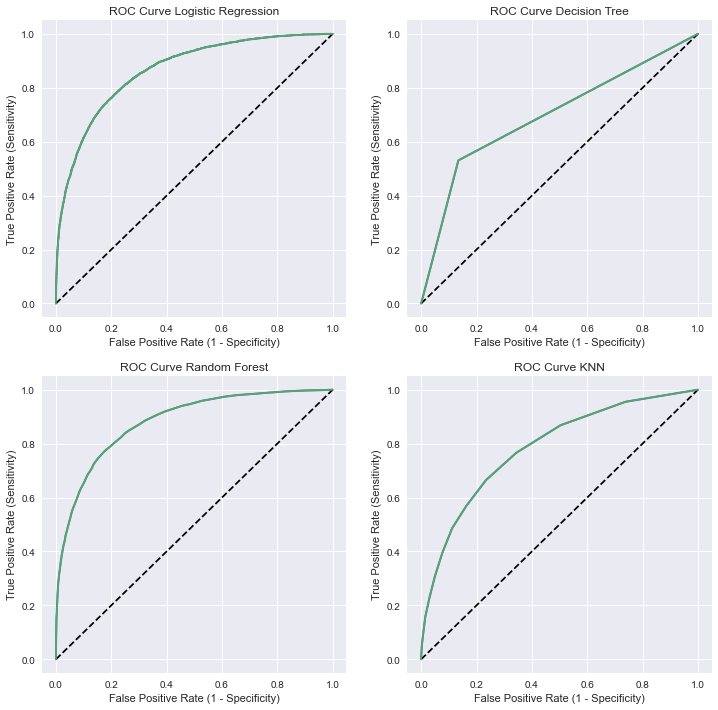

In [303]:
plt.figure(figsize=(12,12))

# Logistic Regression Classification
plt.subplot(2, 2, 1)
y_pred1 = model.predict_proba(X_test)
y_pred1 = model.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred1, pos_label = 'Yes')
plt.plot(fpr, tpr, linewidth=2)
plt.plot([0,1], [0,1], 'k--' )
plt.rcParams['font.size'] = 12
plt.plot(fpr,tpr, label='ANN')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.title('ROC Curve Logistic Regression')



# Decision Tree Classification
plt.subplot(2, 2, 2)
Y_predict4_proba = dtcla.predict_proba(X_test)
Y_predict4_proba = Y_predict4_proba[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, Y_predict4_proba , pos_label = 'Yes')
plt.plot(fpr, tpr, linewidth=2)
plt.plot([0,1], [0,1], 'k--' )
plt.rcParams['font.size'] = 12
plt.plot(fpr,tpr, label='ANN')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.title('ROC Curve Decision Tree')


# Random Forest Classification
plt.subplot(2, 2, 3)
Y_predict5_proba = rfcla.predict_proba(X_test)
Y_predict5_proba = Y_predict5_proba[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, Y_predict5_proba,pos_label = 'Yes')
plt.plot(fpr, tpr, linewidth=2)
plt.plot([0,1], [0,1], 'k--' )
plt.rcParams['font.size'] = 12
plt.plot(fpr,tpr, label='ANN')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.title('ROC Curve Random Forest')


# KNN Classification
plt.subplot(2, 2, 4)
Y_predict6_proba = knncla.predict_proba(X_test)
Y_predict6_proba = Y_predict6_proba[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, Y_predict6_proba,pos_label = 'Yes')
plt.plot(fpr, tpr, linewidth=2)
plt.plot([0,1], [0,1], 'k--' )
plt.rcParams['font.size'] = 12
plt.plot(fpr,tpr, label='ANN')
plt.title('ROC Curve KNN')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')



### ROC AUC score

* ROC AUC For LR : 0.8658 
* ROC AUC For DT : 0.6982 
* ROC AUC For RF : 0.8817
* ROC AUC For KNN : 0.7843


### Classification Metrices

In [295]:
print('Logistic Regression\n')
print(classification_report(y_test, y_pred_test))

print(' Decision Tree\n')
print(classification_report(y_test, Y_predict2))

print('Random Forest\n')
print(classification_report(y_test, Y_predict3))

print('KNN\n')
print(classification_report(y_test, Y_predict4))


Logistic Regression

              precision    recall  f1-score   support

          No       0.86      0.95      0.90     21813
         Yes       0.72      0.48      0.58      6345

    accuracy                           0.84     28158
   macro avg       0.79      0.71      0.74     28158
weighted avg       0.83      0.84      0.83     28158

 Decision Tree

              precision    recall  f1-score   support

          No       0.86      0.87      0.86     21813
         Yes       0.53      0.53      0.53      6345

    accuracy                           0.79     28158
   macro avg       0.70      0.70      0.70     28158
weighted avg       0.79      0.79      0.79     28158

Random Forest

              precision    recall  f1-score   support

          No       0.86      0.96      0.91     21813
         Yes       0.78      0.48      0.59      6345

    accuracy                           0.85     28158
   macro avg       0.82      0.72      0.75     28158
weighted avg       0.8

### Adjusting the threshold level

Text(0, 0.5, 'Frequency')

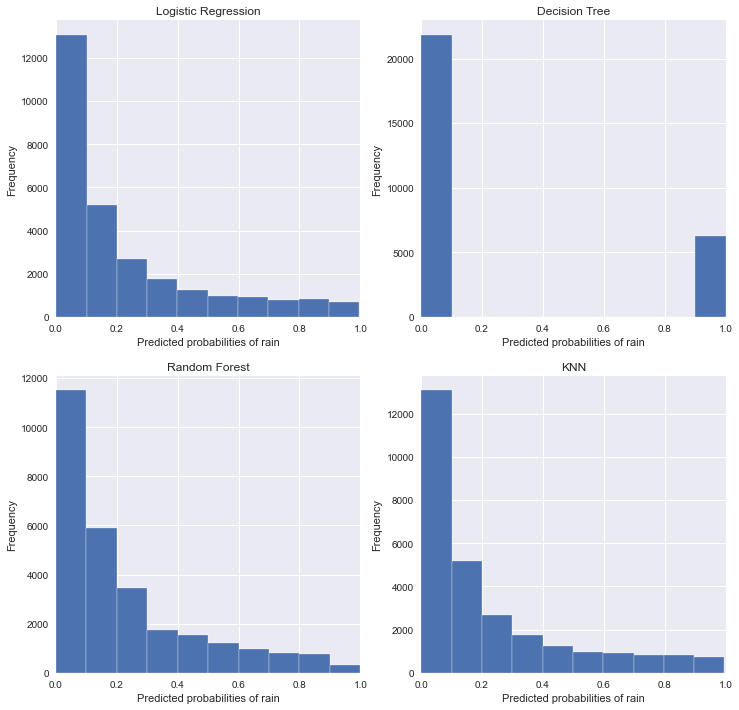

In [296]:
plt.figure(figsize=(12,12))

plt.subplot(2, 2, 1)
plt.hist(y_pred1, bins = 10)
plt.title('Logistic Regression')
plt.xlim(0,1)

plt.xlabel('Predicted probabilities of rain')
plt.ylabel('Frequency')



plt.subplot(2, 2, 2)
plt.hist(y_pred1d, bins = 10)
plt.title('Decision Tree')
plt.xlim(0,1)

plt.xlabel('Predicted probabilities of rain')
plt.ylabel('Frequency')


plt.subplot(2, 2, 3)
plt.hist(y_pred1r, bins = 10)
plt.title('Random Forest')
plt.xlim(0,1)

plt.xlabel('Predicted probabilities of rain')
plt.ylabel('Frequency')



plt.subplot(2, 2, 4)
plt.hist(y_pred1k, bins = 10)
plt.title('KNN')
plt.xlim(0,1)

plt.xlabel('Predicted probabilities of rain')
plt.ylabel('Frequency')

### Lower the threshold : 

We can see that increasing the threshold level results in increased accuracy Logistic Regression , Random Forest & KNN. 

### k fold cross validation score :

* LR Average cross-validation score: 0.8422
* DT Average cross-validation score: 0.7794
* RF Average cross-validation score: 0.8442
* KNN Average cross-validation score: 0.8015


### Hyperparameter Optimization using GridSearch CV

* LR GridSearch CV score on test set: 0.8418
* RF GridSearch CV score on test set: 0.8534


# -------------------------------------------------------------------------------------

# 15 Results and Conclusion 

1. The results indicate that the Random Forest technique presents the best results in terms of prediction followed by Logistic Regression and KNN with test scores close to 85%. The worst results were presented by the Decision Tree , which may be associated with the assumptions of the model.
2. In general, parametric methods have a higher speed in learning the data, in contrast to non-parametric methods, which require more time to train the parameters.
3.  Considering the computation time within the best scores, logistic regression exhibits the best results, followed by random forest, K-Nearest Neighbour while Decision Tree requires considerable time to perform the calculations. 
4. The logistic regression model accuracy score is 84 %  and  Null Accuracy is 78 % . So, the model does a very good job in predicting whether or not it will rain tomorrow in Australia.
5. Small number of observations predict that there will be rain tomorrow. Majority of observations predict that there will be no rain tomorrow.
6. The Logistic Regression model shows no signs of overfitting and underfitting . This means the model generalizing well for unseen data.
7. Increasing the threshold level results in increased accuracy in logistic regression ,random forest and             K-Nearest Neighbour .
8. ROC AUC of our Random Forest and Logistic Regression model approaches towards 1. So, we can conclude that our classifiers does a good job in predicting whether it will rain tomorrow or not.
9. Best Classfication Report is of Random Forest followed by Logistic Regression
10. Our, original model score is found to be 0.841 . The average cross-validation score is 0.842 . So, we can conclude that cross-validation slightly improve the performance of Logistic Regression.
11. For Logistic Regression , original model test accuracy is 0.8417 while GridSearch CV accuracy is 0.8418. 
12. Similarly for Random Forest , original model test accuracy is 0.8519 while GridSearch CV accuracy is 0.8534.
We can see that GridSearch CV slightly improve the performance for  particular models.
